In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


[I 2025-05-22 19:32:56,549] A new study created in memory with name: no-name-40211e6b-d28c-4c8c-898d-a9c0f47056ec
[I 2025-05-22 19:35:11,990] Trial 0 finished with value: 4.806954002380371 and parameters: {'lr': 0.5207393802651459, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4788290508195313}. Best is trial 0 with value: 4.806954002380371.


Cross Validation Accuracies:
[4.698061943054199, 8.28849983215332, 4.609219551086426, 3.329235315322876, 3.109753370285034]
Mean Cross Validation Accuracy:
4.806954002380371
Standard Deviation of Cross Validation Accuracy:
1.8566776921310797


[I 2025-05-22 19:37:11,064] Trial 1 finished with value: 0.48583711981773375 and parameters: {'lr': 0.14821206722117852, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.42401659606183495}. Best is trial 1 with value: 0.48583711981773375.


Cross Validation Accuracies:
[0.3453483581542969, 0.48497283458709717, 0.6122884750366211, 0.5670812726020813, 0.4194946587085724]
Mean Cross Validation Accuracy:
0.48583711981773375
Standard Deviation of Cross Validation Accuracy:
0.0966744215261163


[I 2025-05-22 19:39:17,556] Trial 2 finished with value: 0.38198137283325195 and parameters: {'lr': 0.0017990327302931511, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.44898558787393394}. Best is trial 2 with value: 0.38198137283325195.


Cross Validation Accuracies:
[0.3945857286453247, 0.3404972553253174, 0.35090893507003784, 0.4106607735157013, 0.41325417160987854]
Mean Cross Validation Accuracy:
0.38198137283325195
Standard Deviation of Cross Validation Accuracy:
0.030482106706151802


[I 2025-05-22 19:41:14,372] Trial 3 finished with value: 0.3459877908229828 and parameters: {'lr': 0.005246188654203604, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1902347995967525}. Best is trial 3 with value: 0.3459877908229828.


Cross Validation Accuracies:
[0.3466825485229492, 0.3280908763408661, 0.3273906111717224, 0.38020583987236023, 0.347569078207016]
Mean Cross Validation Accuracy:
0.3459877908229828
Standard Deviation of Cross Validation Accuracy:
0.019183392180527496


[I 2025-05-22 19:43:23,609] Trial 4 finished with value: 0.07813835814595223 and parameters: {'lr': 0.0011231778857048022, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.37280874250356555}. Best is trial 4 with value: 0.07813835814595223.


Cross Validation Accuracies:
[0.06989413499832153, 0.06162116304039955, 0.07905987650156021, 0.10633545368909836, 0.07378116250038147]
Mean Cross Validation Accuracy:
0.07813835814595223
Standard Deviation of Cross Validation Accuracy:
0.015203259495947818


[I 2025-05-22 19:44:58,185] Trial 5 finished with value: 0.06502907425165176 and parameters: {'lr': 0.011787757793726223, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.25593120104123324}. Best is trial 5 with value: 0.06502907425165176.


Cross Validation Accuracies:
[0.05397501215338707, 0.050576504319906235, 0.07602620869874954, 0.08136975765228271, 0.06319788843393326]
Mean Cross Validation Accuracy:
0.06502907425165176
Standard Deviation of Cross Validation Accuracy:
0.012019793742410897


[I 2025-05-22 19:47:02,276] Trial 6 finished with value: 0.14762705713510513 and parameters: {'lr': 0.015969567955221493, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.18197677230034356}. Best is trial 5 with value: 0.06502907425165176.


Cross Validation Accuracies:
[0.2104877084493637, 0.13875021040439606, 0.11412868648767471, 0.14563128352165222, 0.12913739681243896]
Mean Cross Validation Accuracy:
0.14762705713510513
Standard Deviation of Cross Validation Accuracy:
0.03316097519292717


[I 2025-05-22 19:48:43,808] Trial 7 finished with value: 1.5275715827941894 and parameters: {'lr': 0.02160804137706026, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.17515704031435908}. Best is trial 5 with value: 0.06502907425165176.


Cross Validation Accuracies:
[1.5759752988815308, 1.6123671531677246, 1.3425322771072388, 1.5071896314620972, 1.599793553352356]
Mean Cross Validation Accuracy:
1.5275715827941894
Standard Deviation of Cross Validation Accuracy:
0.09940240450467416


[I 2025-05-22 19:52:34,654] Trial 8 finished with value: 30.480395889282228 and parameters: {'lr': 0.2934184716590327, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17684599175649784}. Best is trial 5 with value: 0.06502907425165176.


Cross Validation Accuracies:
[30.73468589782715, 28.85948944091797, 30.00604820251465, 30.046628952026367, 32.755126953125]
Mean Cross Validation Accuracy:
30.480395889282228
Standard Deviation of Cross Validation Accuracy:
1.2868226000038985


[I 2025-05-22 19:54:49,275] Trial 9 finished with value: 0.11962195187807083 and parameters: {'lr': 0.1802961020397526, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.13802591220160176}. Best is trial 5 with value: 0.06502907425165176.


Cross Validation Accuracies:
[0.1049843579530716, 0.10295264422893524, 0.11594710499048233, 0.14597970247268677, 0.12824594974517822]
Mean Cross Validation Accuracy:
0.11962195187807083
Standard Deviation of Cross Validation Accuracy:
0.015967052506219007


[I 2025-05-22 19:57:25,145] Trial 10 finished with value: 0.06275243759155273 and parameters: {'lr': 0.06131875582241127, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.28688977672524996}. Best is trial 10 with value: 0.06275243759155273.


Cross Validation Accuracies:
[0.052304353564977646, 0.05041841045022011, 0.06840286403894424, 0.07918981462717056, 0.06344674527645111]
Mean Cross Validation Accuracy:
0.06275243759155273
Standard Deviation of Cross Validation Accuracy:
0.010619674489919644


[I 2025-05-22 19:59:55,963] Trial 11 finished with value: 0.06566284000873565 and parameters: {'lr': 0.06101956862025096, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.29501654397346416}. Best is trial 10 with value: 0.06275243759155273.


Cross Validation Accuracies:
[0.05184801667928696, 0.0510871522128582, 0.07751409709453583, 0.08575206995010376, 0.06211286410689354]
Mean Cross Validation Accuracy:
0.06566284000873565
Standard Deviation of Cross Validation Accuracy:
0.013855914270818222


[I 2025-05-22 20:02:30,084] Trial 12 finished with value: 0.06602112203836441 and parameters: {'lr': 0.007221700704527825, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.27065963563204676}. Best is trial 10 with value: 0.06275243759155273.


Cross Validation Accuracies:
[0.05445801094174385, 0.051610734313726425, 0.07583093643188477, 0.08248993754386902, 0.06571599096059799]
Mean Cross Validation Accuracy:
0.06602112203836441
Standard Deviation of Cross Validation Accuracy:
0.011907243679134762


[I 2025-05-22 20:05:04,119] Trial 13 finished with value: 0.06377126649022102 and parameters: {'lr': 0.05491171450130625, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.34178135978065594}. Best is trial 10 with value: 0.06275243759155273.


Cross Validation Accuracies:
[0.04905839264392853, 0.04686075076460838, 0.07429390400648117, 0.08457045257091522, 0.06407283246517181]
Mean Cross Validation Accuracy:
0.06377126649022102
Standard Deviation of Cross Validation Accuracy:
0.014462760337351282


[I 2025-05-22 20:07:40,157] Trial 14 finished with value: 0.06323408633470536 and parameters: {'lr': 0.056982690482225894, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3569156812858971}. Best is trial 10 with value: 0.06275243759155273.


Cross Validation Accuracies:
[0.05141439288854599, 0.04665776342153549, 0.0712965875864029, 0.08346528559923172, 0.06333640217781067]
Mean Cross Validation Accuracy:
0.06323408633470536
Standard Deviation of Cross Validation Accuracy:
0.013332632546719419


[I 2025-05-22 20:10:31,327] Trial 15 finished with value: 0.061121337860822675 and parameters: {'lr': 0.09713736353211345, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.34427978512097857}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.04387921467423439, 0.050557926297187805, 0.06807367503643036, 0.0803389847278595, 0.06275688856840134]
Mean Cross Validation Accuracy:
0.061121337860822675
Standard Deviation of Cross Validation Accuracy:
0.01287792254418971


[I 2025-05-22 20:13:54,774] Trial 16 finished with value: 0.06670144721865653 and parameters: {'lr': 0.12979643468467947, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.23168614904903315}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.04805980622768402, 0.0554836131632328, 0.06578736752271652, 0.09881143271923065, 0.0653650164604187]
Mean Cross Validation Accuracy:
0.06670144721865653
Standard Deviation of Cross Validation Accuracy:
0.017361009978918308


[I 2025-05-22 20:18:45,094] Trial 17 finished with value: 0.09193617552518844 and parameters: {'lr': 0.9716807957783486, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3242620529599778}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.06668894737958908, 0.10487134754657745, 0.11878027766942978, 0.08083526045084, 0.08850504457950592]
Mean Cross Validation Accuracy:
0.09193617552518844
Standard Deviation of Cross Validation Accuracy:
0.018222787927447595


[I 2025-05-22 20:23:02,037] Trial 18 finished with value: 0.0662180282175541 and parameters: {'lr': 0.03363719475710361, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4024358600004942}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.05263949930667877, 0.050110187381505966, 0.07811954617500305, 0.08527268469333649, 0.06494822353124619]
Mean Cross Validation Accuracy:
0.0662180282175541
Standard Deviation of Cross Validation Accuracy:
0.013785336055576317


[I 2025-05-22 20:27:16,234] Trial 19 finished with value: 0.06462936550378799 and parameters: {'lr': 0.09801893356417096, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.30387344106221764}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.04744303598999977, 0.052412986755371094, 0.07820476591587067, 0.08405529707670212, 0.06103074178099632]
Mean Cross Validation Accuracy:
0.06462936550378799
Standard Deviation of Cross Validation Accuracy:
0.014277382381959485


[I 2025-05-22 20:32:21,632] Trial 20 finished with value: 0.07982610538601875 and parameters: {'lr': 0.30760335125225646, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2256293676211935}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.07486170530319214, 0.05267375335097313, 0.10738971084356308, 0.10785631835460663, 0.05634903907775879]
Mean Cross Validation Accuracy:
0.07982610538601875
Standard Deviation of Cross Validation Accuracy:
0.02391030454236587


[I 2025-05-22 20:36:18,279] Trial 21 finished with value: 0.06474717408418655 and parameters: {'lr': 0.041924407743819565, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3667922854813981}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.051537271589040756, 0.05021083727478981, 0.07595086097717285, 0.08341318368911743, 0.06262371689081192]
Mean Cross Validation Accuracy:
0.06474717408418655
Standard Deviation of Cross Validation Accuracy:
0.013147305402910675


[I 2025-05-22 20:40:14,873] Trial 22 finished with value: 0.06635674089193344 and parameters: {'lr': 0.07824345956572192, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.37046864722421236}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.058077123016119, 0.04870310798287392, 0.07472722977399826, 0.08603689819574356, 0.06423934549093246]
Mean Cross Validation Accuracy:
0.06635674089193344
Standard Deviation of Cross Validation Accuracy:
0.01297736387691273


[I 2025-05-22 20:44:00,557] Trial 23 finished with value: 0.06566722318530083 and parameters: {'lr': 0.02781413432809838, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3276621860529505}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.05241188034415245, 0.05061562359333038, 0.0760754868388176, 0.08311822265386581, 0.06611490249633789]
Mean Cross Validation Accuracy:
0.06566722318530083
Standard Deviation of Cross Validation Accuracy:
0.012769686884273183


[I 2025-05-22 20:48:04,879] Trial 24 finished with value: 0.07606350183486939 and parameters: {'lr': 0.21911041434057116, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.40116566642456175}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.05644339695572853, 0.04798363149166107, 0.10226862877607346, 0.11284103989601135, 0.06078081205487251]
Mean Cross Validation Accuracy:
0.07606350183486939
Standard Deviation of Cross Validation Accuracy:
0.026253701547457507


[I 2025-05-22 20:52:51,928] Trial 25 finished with value: 0.1717301368713379 and parameters: {'lr': 0.06572629574239262, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2839507890738939}. Best is trial 15 with value: 0.061121337860822675.


Cross Validation Accuracies:
[0.09805843234062195, 0.12358255684375763, 0.20605526864528656, 0.25763463973999023, 0.17331978678703308]
Mean Cross Validation Accuracy:
0.1717301368713379
Standard Deviation of Cross Validation Accuracy:
0.057106978176466434


[I 2025-05-22 20:56:48,801] Trial 26 finished with value: 0.0578386977314949 and parameters: {'lr': 0.10261813581045251, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.35073012189614444}. Best is trial 26 with value: 0.0578386977314949.


Cross Validation Accuracies:
[0.047157105058431625, 0.046801432967185974, 0.06512222439050674, 0.07268901914358139, 0.057423707097768784]
Mean Cross Validation Accuracy:
0.0578386977314949
Standard Deviation of Cross Validation Accuracy:
0.010096253358266973


[I 2025-05-22 21:00:34,577] Trial 27 finished with value: 0.07413076013326644 and parameters: {'lr': 0.47202078045112733, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.10322957727670243}. Best is trial 26 with value: 0.0578386977314949.


Cross Validation Accuracies:
[0.08413758873939514, 0.06982605904340744, 0.07162212580442429, 0.07119783014059067, 0.07387019693851471]
Mean Cross Validation Accuracy:
0.07413076013326644
Standard Deviation of Cross Validation Accuracy:
0.005169725097946903


[I 2025-05-22 21:03:42,228] Trial 28 finished with value: 0.05769564136862755 and parameters: {'lr': 0.10413761359774248, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.24748328425006383}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.04375471547245979, 0.046575069427490234, 0.0610627755522728, 0.07024022936820984, 0.06684541702270508]
Mean Cross Validation Accuracy:
0.05769564136862755
Standard Deviation of Cross Validation Accuracy:
0.010681191041736286


[I 2025-05-22 21:06:56,049] Trial 29 finished with value: 2.375606894493103 and parameters: {'lr': 0.6845374627870915, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.49299071115127}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[1.7863742113113403, 2.098379611968994, 2.051391363143921, 4.003806114196777, 1.9380831718444824]
Mean Cross Validation Accuracy:
2.375606894493103
Standard Deviation of Cross Validation Accuracy:
0.8211730072033877


[I 2025-05-22 21:09:49,335] Trial 30 finished with value: 0.06209512874484062 and parameters: {'lr': 0.32203811112395103, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2511117467235251}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.054295334964990616, 0.050998255610466, 0.07125017791986465, 0.06770996004343033, 0.06622191518545151]
Mean Cross Validation Accuracy:
0.06209512874484062
Standard Deviation of Cross Validation Accuracy:
0.007954231560669236


[I 2025-05-22 21:13:02,409] Trial 31 finished with value: 0.0754969835281372 and parameters: {'lr': 0.3996527651117113, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.22899769424294772}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.07288955897092819, 0.07364149391651154, 0.08040931075811386, 0.06469959020614624, 0.0858449637889862]
Mean Cross Validation Accuracy:
0.0754969835281372
Standard Deviation of Cross Validation Accuracy:
0.0071838271327121055


[I 2025-05-22 21:16:15,648] Trial 32 finished with value: 0.06047782525420189 and parameters: {'lr': 0.11999030273496059, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2510674312568697}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.05158252641558647, 0.056083641946315765, 0.06500177085399628, 0.06522923707962036, 0.06449194997549057]
Mean Cross Validation Accuracy:
0.06047782525420189
Standard Deviation of Cross Validation Accuracy:
0.005614096254505515


[I 2025-05-22 21:19:16,370] Trial 33 finished with value: 0.09005928337574005 and parameters: {'lr': 0.11656986837088743, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4498476950122632}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.08714510500431061, 0.0908765122294426, 0.09599516540765762, 0.10416824370622635, 0.07211139053106308]
Mean Cross Validation Accuracy:
0.09005928337574005
Standard Deviation of Cross Validation Accuracy:
0.01063564396967025


[I 2025-05-22 21:22:34,816] Trial 34 finished with value: 0.06868459358811378 and parameters: {'lr': 0.12894778608944235, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.20855236444718034}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.06911579519510269, 0.05037546157836914, 0.09286156296730042, 0.06858043372631073, 0.06248971447348595]
Mean Cross Validation Accuracy:
0.06868459358811378
Standard Deviation of Cross Validation Accuracy:
0.013844301893991743


[I 2025-05-22 21:25:38,352] Trial 35 finished with value: 0.06130421683192253 and parameters: {'lr': 0.20276061164732587, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.30821451093882735}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.06575469672679901, 0.048830296844244, 0.055241409689188004, 0.08445102721452713, 0.05224365368485451]
Mean Cross Validation Accuracy:
0.06130421683192253
Standard Deviation of Cross Validation Accuracy:
0.012884344896299211


[I 2025-05-22 21:28:51,265] Trial 36 finished with value: 0.05935325846076012 and parameters: {'lr': 0.09494221086853333, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.39799410534368906}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.04927836358547211, 0.04398370906710625, 0.06295469403266907, 0.07209077477455139, 0.06845875084400177]
Mean Cross Validation Accuracy:
0.05935325846076012
Standard Deviation of Cross Validation Accuracy:
0.01091651232652675


[I 2025-05-22 21:32:09,694] Trial 37 finished with value: 0.06973993107676506 and parameters: {'lr': 0.17047077419469103, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.43140535827960147}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.05372822284698486, 0.04745190218091011, 0.0828668549656868, 0.09332568943500519, 0.07132698595523834]
Mean Cross Validation Accuracy:
0.06973993107676506
Standard Deviation of Cross Validation Accuracy:
0.017229358106465836


[I 2025-05-22 21:35:26,251] Trial 38 finished with value: 0.5407950043678283 and parameters: {'lr': 0.033189050707355526, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4087826046577296}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.478650838136673, 0.6822767853736877, 0.41655462980270386, 0.6506450772285461, 0.47584769129753113]
Mean Cross Validation Accuracy:
0.5407950043678283
Standard Deviation of Cross Validation Accuracy:
0.1054512725459433


[I 2025-05-22 21:38:39,085] Trial 39 finished with value: 0.06390969306230546 and parameters: {'lr': 0.020181442521252452, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.25507379267982366}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.05297031253576279, 0.049691952764987946, 0.06936659663915634, 0.08329767733812332, 0.06422192603349686]
Mean Cross Validation Accuracy:
0.06390969306230546
Standard Deviation of Cross Validation Accuracy:
0.012063029518501354


[I 2025-05-22 21:42:39,534] Trial 40 finished with value: 0.07294551655650139 and parameters: {'lr': 0.0023150596336217375, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.46554050276962605}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.07043072581291199, 0.05685680732131004, 0.07646889239549637, 0.09527523070573807, 0.06569592654705048]
Mean Cross Validation Accuracy:
0.07294551655650139
Standard Deviation of Cross Validation Accuracy:
0.01287445225190679


[I 2025-05-22 21:45:56,462] Trial 41 finished with value: 0.06284537687897682 and parameters: {'lr': 0.09274660576709895, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.34359558685819686}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.048438336700201035, 0.05000843107700348, 0.06649885326623917, 0.07995901256799698, 0.06932225078344345]
Mean Cross Validation Accuracy:
0.06284537687897682
Standard Deviation of Cross Validation Accuracy:
0.012004368338390902


[I 2025-05-22 21:49:06,050] Trial 42 finished with value: 0.06268345639109611 and parameters: {'lr': 0.0923608453144436, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3913379065146195}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.05646051466464996, 0.049578581005334854, 0.06406006962060928, 0.07737109065055847, 0.065947026014328]
Mean Cross Validation Accuracy:
0.06268345639109611
Standard Deviation of Cross Validation Accuracy:
0.009367340213915163


[I 2025-05-22 21:52:18,274] Trial 43 finished with value: 0.06478444412350655 and parameters: {'lr': 0.044668402205662684, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3822500425762504}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.05201447010040283, 0.0512348897755146, 0.07332189381122589, 0.08363235741853714, 0.06371860951185226]
Mean Cross Validation Accuracy:
0.06478444412350655
Standard Deviation of Cross Validation Accuracy:
0.01245737167902332


[I 2025-05-22 21:57:17,352] Trial 44 finished with value: 0.06265868246555328 and parameters: {'lr': 0.23101450470931728, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.42076204303946163}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.06368034332990646, 0.04400642216205597, 0.06056903675198555, 0.08417380601167679, 0.06086380407214165]
Mean Cross Validation Accuracy:
0.06265868246555328
Standard Deviation of Cross Validation Accuracy:
0.012801869818206234


[I 2025-05-22 22:00:06,736] Trial 45 finished with value: 0.06613985821604729 and parameters: {'lr': 0.12602682378653854, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.27333654592397816}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.04796301946043968, 0.058156076818704605, 0.0819372907280922, 0.08154202997684479, 0.06110087409615517]
Mean Cross Validation Accuracy:
0.06613985821604729
Standard Deviation of Cross Validation Accuracy:
0.013463397509025424


[I 2025-05-22 22:05:20,113] Trial 46 finished with value: 0.11048345863819123 and parameters: {'lr': 0.17124127089923688, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1592629176042488}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.09270691871643066, 0.08240744471549988, 0.11456657201051712, 0.14604416489601135, 0.1166921928524971]
Mean Cross Validation Accuracy:
0.11048345863819123
Standard Deviation of Cross Validation Accuracy:
0.022018410270894816


[I 2025-05-22 22:08:48,458] Trial 47 finished with value: 0.05950184836983681 and parameters: {'lr': 0.07776089926632457, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31700043700893543}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.06369788199663162, 0.05304921790957451, 0.06464716047048569, 0.06594463437795639, 0.05017034709453583]
Mean Cross Validation Accuracy:
0.05950184836983681
Standard Deviation of Cross Validation Accuracy:
0.006546812694194737


[I 2025-05-22 22:12:09,689] Trial 48 finished with value: 0.057827608287334444 and parameters: {'lr': 0.04587159577433296, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31526989751554574}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.05076293647289276, 0.04084968566894531, 0.06556522846221924, 0.07287483662366867, 0.05908535420894623]
Mean Cross Validation Accuracy:
0.057827608287334444
Standard Deviation of Cross Validation Accuracy:
0.011189559559354165


[I 2025-05-22 22:15:21,448] Trial 49 finished with value: 0.07922452390193939 and parameters: {'lr': 0.01178443411118037, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.32554457251361757}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.07066082209348679, 0.07331889867782593, 0.0699549987912178, 0.11235015839338303, 0.06983774155378342]
Mean Cross Validation Accuracy:
0.07922452390193939
Standard Deviation of Cross Validation Accuracy:
0.016610579984109225


[I 2025-05-22 22:18:18,396] Trial 50 finished with value: 0.05906420946121216 and parameters: {'lr': 0.04681232833017607, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.315701226528644}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.04512424021959305, 0.046844664961099625, 0.07848919928073883, 0.06593305617570877, 0.05892988666892052]
Mean Cross Validation Accuracy:
0.05906420946121216
Standard Deviation of Cross Validation Accuracy:
0.012394912968924084


[I 2025-05-22 22:20:40,094] Trial 51 finished with value: 0.06085881143808365 and parameters: {'lr': 0.04920869264626494, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31344523362973054}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.04235733300447464, 0.03945120424032211, 0.07289989292621613, 0.08164907991886139, 0.06793654710054398]
Mean Cross Validation Accuracy:
0.06085881143808365
Standard Deviation of Cross Validation Accuracy:
0.016899157370574902


[I 2025-05-22 22:23:35,635] Trial 52 finished with value: 0.06335961073637009 and parameters: {'lr': 0.026344452026660813, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.35545574625841836}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.05020308122038841, 0.055703822523355484, 0.07192577421665192, 0.0794309452176094, 0.059534430503845215]
Mean Cross Validation Accuracy:
0.06335961073637009
Standard Deviation of Cross Validation Accuracy:
0.010751784174336048


[I 2025-05-22 22:26:06,263] Trial 53 finished with value: 0.06660759449005127 and parameters: {'lr': 0.07361528333620569, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2913677364134742}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.06469348073005676, 0.04058937355875969, 0.08482903987169266, 0.08963657170534134, 0.0532895065844059]
Mean Cross Validation Accuracy:
0.06660759449005127
Standard Deviation of Cross Validation Accuracy:
0.018549059171595127


[I 2025-05-22 22:28:40,402] Trial 54 finished with value: 0.058553730696439744 and parameters: {'lr': 0.041414950032326855, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3339234023274053}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.04312322288751602, 0.050273191183805466, 0.06716617941856384, 0.07643913477659225, 0.05576692521572113]
Mean Cross Validation Accuracy:
0.058553730696439744
Standard Deviation of Cross Validation Accuracy:
0.011903748508352062


[I 2025-05-22 22:31:10,610] Trial 55 finished with value: 0.06481262147426606 and parameters: {'lr': 0.014053422541124143, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.33713293567196867}. Best is trial 28 with value: 0.05769564136862755.


Cross Validation Accuracies:
[0.054291244596242905, 0.04913400486111641, 0.07388455420732498, 0.08248909562826157, 0.0642642080783844]
Mean Cross Validation Accuracy:
0.06481262147426606
Standard Deviation of Cross Validation Accuracy:
0.012260316876772247


[I 2025-05-22 22:33:48,350] Trial 56 finished with value: 0.05602454170584679 and parameters: {'lr': 0.03813314916272338, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.27233138540644264}. Best is trial 56 with value: 0.05602454170584679.


Cross Validation Accuracies:
[0.04273711144924164, 0.04016586020588875, 0.06467707455158234, 0.07624674588441849, 0.05629591643810272]
Mean Cross Validation Accuracy:
0.05602454170584679
Standard Deviation of Cross Validation Accuracy:
0.013505044187065362


[I 2025-05-22 22:36:56,257] Trial 57 finished with value: 3.4990164279937743 and parameters: {'lr': 0.03915327421879102, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2716027280451847}. Best is trial 56 with value: 0.05602454170584679.


Cross Validation Accuracies:
[3.3445889949798584, 3.9655706882476807, 3.3160130977630615, 2.7860403060913086, 4.082869052886963]
Mean Cross Validation Accuracy:
3.4990164279937743
Standard Deviation of Cross Validation Accuracy:
0.47417924178555404


[I 2025-05-22 22:39:53,378] Trial 58 finished with value: 0.06320838630199432 and parameters: {'lr': 0.020672247996319792, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.20931524271226049}. Best is trial 56 with value: 0.05602454170584679.


Cross Validation Accuracies:
[0.04946184530854225, 0.051132846623659134, 0.0734308734536171, 0.08244003355503082, 0.059576332569122314]
Mean Cross Validation Accuracy:
0.06320838630199432
Standard Deviation of Cross Validation Accuracy:
0.012824456025551293


[I 2025-05-22 22:44:43,342] Trial 59 finished with value: 0.06207203269004822 and parameters: {'lr': 0.026095508179609976, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2966074156396293}. Best is trial 56 with value: 0.05602454170584679.


Cross Validation Accuracies:
[0.0486062727868557, 0.04961210489273071, 0.07496381551027298, 0.0760430097579956, 0.06113496050238609]
Mean Cross Validation Accuracy:
0.06207203269004822
Standard Deviation of Cross Validation Accuracy:
0.011822358980225874


[I 2025-05-22 22:51:27,985] Trial 60 finished with value: 0.061396797001361844 and parameters: {'lr': 0.036538953088097764, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.27979892277988583}. Best is trial 56 with value: 0.05602454170584679.


Cross Validation Accuracies:
[0.046098385006189346, 0.05328960716724396, 0.07054324448108673, 0.07681801915168762, 0.06023472920060158]
Mean Cross Validation Accuracy:
0.061396797001361844
Standard Deviation of Cross Validation Accuracy:
0.011158762765316682


[I 2025-05-22 22:58:31,630] Trial 61 finished with value: 0.056158261746168135 and parameters: {'lr': 0.05234836605934556, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3581016710881415}. Best is trial 56 with value: 0.05602454170584679.


Cross Validation Accuracies:
[0.04547642543911934, 0.045068804174661636, 0.06521803885698318, 0.07514432072639465, 0.04988371953368187]
Mean Cross Validation Accuracy:
0.056158261746168135
Standard Deviation of Cross Validation Accuracy:
0.011991643532021697


[I 2025-05-22 23:07:57,975] Trial 62 finished with value: 0.05526793375611305 and parameters: {'lr': 0.053455664035895634, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3539467443995447}. Best is trial 62 with value: 0.05526793375611305.


Cross Validation Accuracies:
[0.04682141914963722, 0.04323512688279152, 0.05850644409656525, 0.06968935579061508, 0.05808732286095619]
Mean Cross Validation Accuracy:
0.05526793375611305
Standard Deviation of Cross Validation Accuracy:
0.009407936733365166


[I 2025-05-22 23:18:34,816] Trial 63 finished with value: 0.06059490516781807 and parameters: {'lr': 0.05952614412305123, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3825303188902583}. Best is trial 62 with value: 0.05526793375611305.


Cross Validation Accuracies:
[0.04522285610437393, 0.05478975549340248, 0.0649418905377388, 0.08477330207824707, 0.053246721625328064]
Mean Cross Validation Accuracy:
0.06059490516781807
Standard Deviation of Cross Validation Accuracy:
0.013619740199357473


[I 2025-05-22 23:28:12,452] Trial 64 finished with value: 0.0630561113357544 and parameters: {'lr': 0.016404954302852406, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.35166212086195925}. Best is trial 62 with value: 0.05526793375611305.


Cross Validation Accuracies:
[0.05108398571610451, 0.048677634447813034, 0.071132592856884, 0.0802110880613327, 0.06417525559663773]
Mean Cross Validation Accuracy:
0.0630561113357544
Standard Deviation of Cross Validation Accuracy:
0.011923486516641772


[I 2025-05-22 23:35:23,644] Trial 65 finished with value: 0.061318963021039966 and parameters: {'lr': 0.05853703338809701, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.36246263442888516}. Best is trial 62 with value: 0.05526793375611305.


Cross Validation Accuracies:
[0.04450203850865364, 0.050493478775024414, 0.06832480430603027, 0.0760876014828682, 0.06718689203262329]
Mean Cross Validation Accuracy:
0.061318963021039966
Standard Deviation of Cross Validation Accuracy:
0.011845903462612542


[I 2025-05-22 23:42:57,768] Trial 66 finished with value: 0.0633495070040226 and parameters: {'lr': 0.030572789078459083, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3302507762867914}. Best is trial 62 with value: 0.05526793375611305.


Cross Validation Accuracies:
[0.04920077696442604, 0.04977913200855255, 0.07073291391134262, 0.08076442778110504, 0.06627028435468674]
Mean Cross Validation Accuracy:
0.0633495070040226
Standard Deviation of Cross Validation Accuracy:
0.01225289143683508


[I 2025-05-22 23:53:04,953] Trial 67 finished with value: 0.07018978297710418 and parameters: {'lr': 0.00846870187015122, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.37295014872698634}. Best is trial 62 with value: 0.05526793375611305.


Cross Validation Accuracies:
[0.056350674480199814, 0.05814535543322563, 0.08584992587566376, 0.08434600383043289, 0.06625695526599884]
Mean Cross Validation Accuracy:
0.07018978297710418
Standard Deviation of Cross Validation Accuracy:
0.01263087453112882


[I 2025-05-23 00:01:00,523] Trial 68 finished with value: 0.06206647753715515 and parameters: {'lr': 0.047592881808757696, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.23964142225179474}. Best is trial 62 with value: 0.05526793375611305.


Cross Validation Accuracies:
[0.0486990250647068, 0.04874164238572121, 0.06669386476278305, 0.08947117626667023, 0.05672667920589447]
Mean Cross Validation Accuracy:
0.06206647753715515
Standard Deviation of Cross Validation Accuracy:
0.015213044985314273


[I 2025-05-23 00:08:54,546] Trial 69 finished with value: 0.055258999764919284 and parameters: {'lr': 0.07248783580328576, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.30100724679777885}. Best is trial 69 with value: 0.055258999764919284.


Cross Validation Accuracies:
[0.05633442476391792, 0.04781465604901314, 0.057507481426000595, 0.059576068073511124, 0.055062368512153625]
Mean Cross Validation Accuracy:
0.055258999764919284
Standard Deviation of Cross Validation Accuracy:
0.0040076478063785425


[I 2025-05-23 00:16:46,631] Trial 70 finished with value: 0.06185231059789657 and parameters: {'lr': 0.07129131185680346, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.263391502128878}. Best is trial 69 with value: 0.055258999764919284.


Cross Validation Accuracies:
[0.048429109156131744, 0.051027145236730576, 0.09129681438207626, 0.07259178161621094, 0.04591670259833336]
Mean Cross Validation Accuracy:
0.06185231059789657
Standard Deviation of Cross Validation Accuracy:
0.017513567227771244


[I 2025-05-23 00:24:05,570] Trial 71 finished with value: 0.05731473937630653 and parameters: {'lr': 0.05292172209382902, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3033945367509689}. Best is trial 69 with value: 0.055258999764919284.


Cross Validation Accuracies:
[0.0416259765625, 0.04100351780653, 0.07035315036773682, 0.0788152739405632, 0.05477577820420265]
Mean Cross Validation Accuracy:
0.05731473937630653
Standard Deviation of Cross Validation Accuracy:
0.015171767855394565


[I 2025-05-23 00:32:04,537] Trial 72 finished with value: 0.056977111101150515 and parameters: {'lr': 0.07914956321656948, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3046696755279153}. Best is trial 69 with value: 0.055258999764919284.


Cross Validation Accuracies:
[0.05245667323470116, 0.04638851061463356, 0.058026257902383804, 0.0682540237903595, 0.059760089963674545]
Mean Cross Validation Accuracy:
0.056977111101150515
Standard Deviation of Cross Validation Accuracy:
0.00732894615790473


[I 2025-05-23 00:40:07,265] Trial 73 finished with value: 0.05660480558872223 and parameters: {'lr': 0.05560885754058613, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2998264898392364}. Best is trial 69 with value: 0.055258999764919284.


Cross Validation Accuracies:
[0.04315757006406784, 0.04785896837711334, 0.05735594406723976, 0.07466655969619751, 0.05998498573899269]
Mean Cross Validation Accuracy:
0.05660480558872223
Standard Deviation of Cross Validation Accuracy:
0.010913611685309148


[I 2025-05-23 00:49:14,001] Trial 74 finished with value: 0.07408845201134681 and parameters: {'lr': 0.14423904609151342, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2991066788998786}. Best is trial 69 with value: 0.055258999764919284.


Cross Validation Accuracies:
[0.06412757933139801, 0.052902523428201675, 0.0579395666718483, 0.11080563068389893, 0.08466695994138718]
Mean Cross Validation Accuracy:
0.07408845201134681
Standard Deviation of Cross Validation Accuracy:
0.02130213647445997


[I 2025-05-23 00:56:36,314] Trial 75 finished with value: 0.07803418785333634 and parameters: {'lr': 0.08466818553865034, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.26130349668426933}. Best is trial 69 with value: 0.055258999764919284.


Cross Validation Accuracies:
[0.07649344950914383, 0.053253546357154846, 0.09627557545900345, 0.08896536380052567, 0.07518300414085388]
Mean Cross Validation Accuracy:
0.07803418785333634
Standard Deviation of Cross Validation Accuracy:
0.014675299966531918


[I 2025-05-23 01:03:19,581] Trial 76 finished with value: 0.051908043771982194 and parameters: {'lr': 0.06077065962790183, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28693073271555414}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.044655557721853256, 0.043497055768966675, 0.056257907301187515, 0.06708838045597076, 0.048041317611932755]
Mean Cross Validation Accuracy:
0.051908043771982194
Standard Deviation of Cross Validation Accuracy:
0.008805211852680846


[I 2025-05-23 01:10:31,006] Trial 77 finished with value: 0.05950208529829979 and parameters: {'lr': 0.05495566264779682, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.27964977531775476}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.04201851785182953, 0.04071105271577835, 0.07479119300842285, 0.08115259557962418, 0.05883706733584404]
Mean Cross Validation Accuracy:
0.05950208529829979
Standard Deviation of Cross Validation Accuracy:
0.01650285851043099


[I 2025-05-23 01:17:40,403] Trial 78 finished with value: 6.117821121215821 and parameters: {'lr': 0.06223931485185522, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.29030584004882254}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[4.963347911834717, 6.716780185699463, 5.364955902099609, 6.1134233474731445, 7.430598258972168]
Mean Cross Validation Accuracy:
6.117821121215821
Standard Deviation of Cross Validation Accuracy:
0.8923866363959477


[I 2025-05-23 01:24:50,587] Trial 79 finished with value: 0.06113630831241608 and parameters: {'lr': 0.03312070492461642, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2854049351274492}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.05182623490691185, 0.04655870422720909, 0.06909076124429703, 0.07729527354240417, 0.06091056764125824]
Mean Cross Validation Accuracy:
0.06113630831241608
Standard Deviation of Cross Validation Accuracy:
0.011167993958460123


[I 2025-05-23 01:30:45,486] Trial 80 finished with value: 0.15884162485599518 and parameters: {'lr': 0.025932632386307313, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.32303044126028774}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.17824292182922363, 0.14642006158828735, 0.18902824819087982, 0.10493035614490509, 0.17558653652668]
Mean Cross Validation Accuracy:
0.15884162485599518
Standard Deviation of Cross Validation Accuracy:
0.030426155680656312


[I 2025-05-23 01:37:33,138] Trial 81 finished with value: 0.1131194919347763 and parameters: {'lr': 0.10706988033177735, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.24072855323815875}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.1027289554476738, 0.08907514810562134, 0.13012361526489258, 0.13813279569149017, 0.10553694516420364]
Mean Cross Validation Accuracy:
0.1131194919347763
Standard Deviation of Cross Validation Accuracy:
0.018212052653360046


[I 2025-05-23 01:43:43,283] Trial 82 finished with value: 0.058401255309581755 and parameters: {'lr': 0.06863561092583711, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3024892473232721}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.0435425341129303, 0.04409271478652954, 0.0626058354973793, 0.07436911016702652, 0.06739608198404312]
Mean Cross Validation Accuracy:
0.058401255309581755
Standard Deviation of Cross Validation Accuracy:
0.012482577600057533


[I 2025-05-23 01:50:04,902] Trial 83 finished with value: 0.07397496476769447 and parameters: {'lr': 0.08417029637814175, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.217529760126206}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.05293269455432892, 0.06596533954143524, 0.05558573827147484, 0.11622601002454758, 0.07916504144668579]
Mean Cross Validation Accuracy:
0.07397496476769447
Standard Deviation of Cross Validation Accuracy:
0.02305290699394393


[I 2025-05-23 01:58:20,407] Trial 84 finished with value: 0.07415885329246522 and parameters: {'lr': 0.14895687749089134, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2679001350910427}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.07155776023864746, 0.08969410508871078, 0.06389982253313065, 0.0684022530913353, 0.07724032551050186]
Mean Cross Validation Accuracy:
0.07415885329246522
Standard Deviation of Cross Validation Accuracy:
0.008899341127010737


[I 2025-05-23 02:06:09,840] Trial 85 finished with value: 0.06027951762080193 and parameters: {'lr': 0.05113900989725294, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3026238589635325}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.04240567237138748, 0.04769345745444298, 0.06252357363700867, 0.0947725847363472, 0.0540022999048233]
Mean Cross Validation Accuracy:
0.06027951762080193
Standard Deviation of Cross Validation Accuracy:
0.01850456258983931


[I 2025-05-23 02:15:31,355] Trial 86 finished with value: 0.05750481486320495 and parameters: {'lr': 0.03635820498583106, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2474682522303843}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.04817165434360504, 0.04623324051499367, 0.06091558560729027, 0.07339531183242798, 0.058808282017707825]
Mean Cross Validation Accuracy:
0.05750481486320495
Standard Deviation of Cross Validation Accuracy:
0.009797923771823655


[I 2025-05-23 02:25:26,685] Trial 87 finished with value: 0.06192546188831329 and parameters: {'lr': 0.0389510596692039, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3453278947248943}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.04875636473298073, 0.04859805107116699, 0.07111813127994537, 0.08295994997024536, 0.05819481238722801]
Mean Cross Validation Accuracy:
0.06192546188831329
Standard Deviation of Cross Validation Accuracy:
0.013356029380682838


[I 2025-05-23 02:33:31,565] Trial 88 finished with value: 0.06337598636746407 and parameters: {'lr': 0.023065178570610433, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.30806803366694946}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.04935626685619354, 0.05178944766521454, 0.07379300892353058, 0.07991929352283478, 0.06202191486954689]
Mean Cross Validation Accuracy:
0.06337598636746407
Standard Deviation of Cross Validation Accuracy:
0.01195683314649356


[I 2025-05-23 02:41:31,710] Trial 89 finished with value: 0.06435910910367966 and parameters: {'lr': 0.017797163391171926, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.18820226165444004}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.051161013543605804, 0.04915753751993179, 0.07637825608253479, 0.08042622357606888, 0.06467251479625702]
Mean Cross Validation Accuracy:
0.06435910910367966
Standard Deviation of Cross Validation Accuracy:
0.01271210281365733


[I 2025-05-23 02:49:22,194] Trial 90 finished with value: 0.05976375415921211 and parameters: {'lr': 0.03021430734838654, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.27690126460099235}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.047972794622182846, 0.04626226797699928, 0.06280730664730072, 0.08205267041921616, 0.05972373113036156]
Mean Cross Validation Accuracy:
0.05976375415921211
Standard Deviation of Cross Validation Accuracy:
0.012863727745629622


[I 2025-05-23 02:58:19,328] Trial 91 finished with value: 0.13652290105819703 and parameters: {'lr': 0.06959384990253932, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.24321707646764848}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.12563569843769073, 0.1266731321811676, 0.14103151857852936, 0.15343670547008514, 0.13583745062351227]
Mean Cross Validation Accuracy:
0.13652290105819703
Standard Deviation of Cross Validation Accuracy:
0.010221774618504554


[I 2025-05-23 03:05:14,831] Trial 92 finished with value: 0.056403187662363054 and parameters: {'lr': 0.052586716837114036, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25581324086309054}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.052014924585819244, 0.04018891602754593, 0.06390022486448288, 0.06961367279291153, 0.05629820004105568]
Mean Cross Validation Accuracy:
0.056403187662363054
Standard Deviation of Cross Validation Accuracy:
0.010128109044354051


[I 2025-05-23 03:11:58,001] Trial 93 finished with value: 0.053701525926589964 and parameters: {'lr': 0.051762714036632455, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25719528570616157}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.05089057981967926, 0.039175063371658325, 0.05925779044628143, 0.0653148666024208, 0.053869329392910004]
Mean Cross Validation Accuracy:
0.053701525926589964
Standard Deviation of Cross Validation Accuracy:
0.008771424598601826


[I 2025-05-23 03:17:46,811] Trial 94 finished with value: 0.05490830317139626 and parameters: {'lr': 0.05438725339605337, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25713118015490033}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.039165597409009933, 0.04937702789902687, 0.062337636947631836, 0.06856755167245865, 0.05509370192885399]
Mean Cross Validation Accuracy:
0.05490830317139626
Standard Deviation of Cross Validation Accuracy:
0.010200316010120013


[I 2025-05-23 03:23:32,005] Trial 95 finished with value: 0.06978389993309975 and parameters: {'lr': 0.07840759656795974, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2576873754279264}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.04588361084461212, 0.04792550578713417, 0.09779875725507736, 0.06724368780851364, 0.09006793797016144]
Mean Cross Validation Accuracy:
0.06978389993309975
Standard Deviation of Cross Validation Accuracy:
0.021221405800046732


[I 2025-05-23 03:31:04,301] Trial 96 finished with value: 4.104534769058228 and parameters: {'lr': 0.04296259177777499, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.22490332838883847}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[4.834275722503662, 2.7570722103118896, 3.739853858947754, 4.642061233520508, 4.549410820007324]
Mean Cross Validation Accuracy:
4.104534769058228
Standard Deviation of Cross Validation Accuracy:
0.7704568480146134


[I 2025-05-23 03:37:48,145] Trial 97 finished with value: 0.06473895534873009 and parameters: {'lr': 0.06662113846126165, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2853277953010313}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.06994378566741943, 0.044515855610370636, 0.055896248668432236, 0.08135496079921722, 0.07198392599821091]
Mean Cross Validation Accuracy:
0.06473895534873009
Standard Deviation of Cross Validation Accuracy:
0.012983364124526608


[I 2025-05-23 03:45:07,453] Trial 98 finished with value: 0.07013156190514565 and parameters: {'lr': 0.10682477533836536, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.25835268872543354}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.06047370657324791, 0.051491037011146545, 0.061178602278232574, 0.1077725812792778, 0.0697418823838234]
Mean Cross Validation Accuracy:
0.07013156190514565
Standard Deviation of Cross Validation Accuracy:
0.01968703641318282


[I 2025-05-23 03:51:42,950] Trial 99 finished with value: 0.42206214666366576 and parameters: {'lr': 0.05548895682785742, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.23371758841603046}. Best is trial 76 with value: 0.051908043771982194.


Cross Validation Accuracies:
[0.6556891798973083, 0.34094104170799255, 0.33434414863586426, 0.378642201423645, 0.4006941616535187]
Mean Cross Validation Accuracy:
0.42206214666366576
Standard Deviation of Cross Validation Accuracy:
0.11933025930821449
Number of finished trials: 100
Best trial: {'lr': 0.06077065962790183, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28693073271555414}
Best hyperparameters:  {'lr': 0.06077065962790183, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28693073271555414}
Fold 1:
Epoch 1/100
84/84 [==============================] - 29s 204ms/step - loss: 0.1257 - val_loss: 0.0875
Epoch 2/100
84/84 [==============================] - 14s 167ms/step - loss: 0.0934 - val_loss: 0.1095
Epoch 3/100
84/84 [==============================] - 9s 103ms/step - loss: 0.0867 - val_loss: 0.1004
Epoch 4/100
84/84 [==============================] - 7s 79ms/step

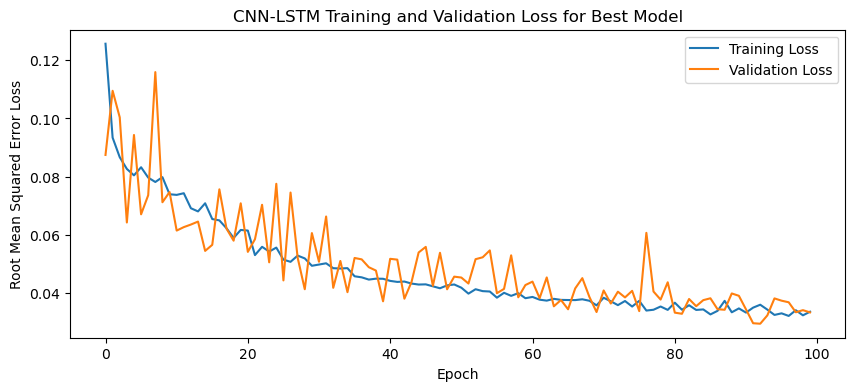

1/1 - 3s - loss: 0.0251 - 3s/epoch - 3s/step
Test Loss: 0.02509606070816517
1/1 [==============================] - 0s 128ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

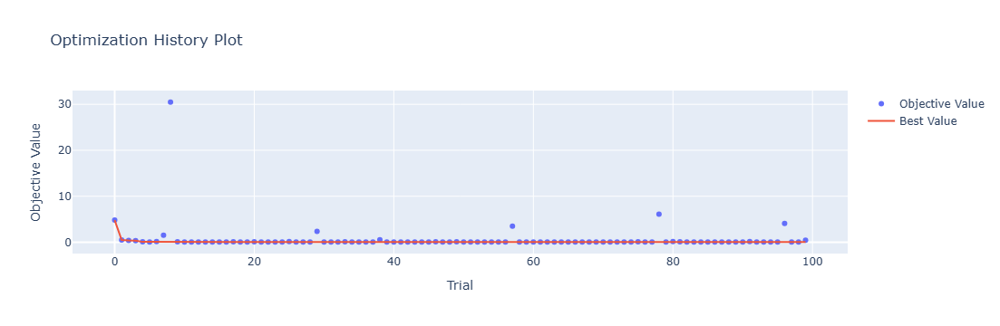

In [4]:
optuna.visualization.plot_optimization_history(study)

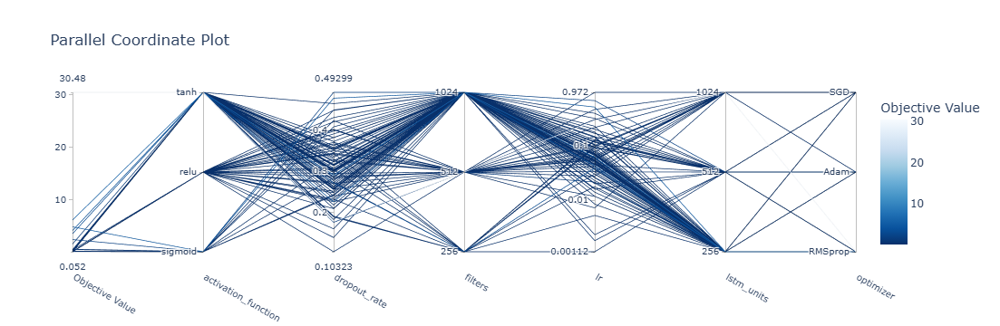

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

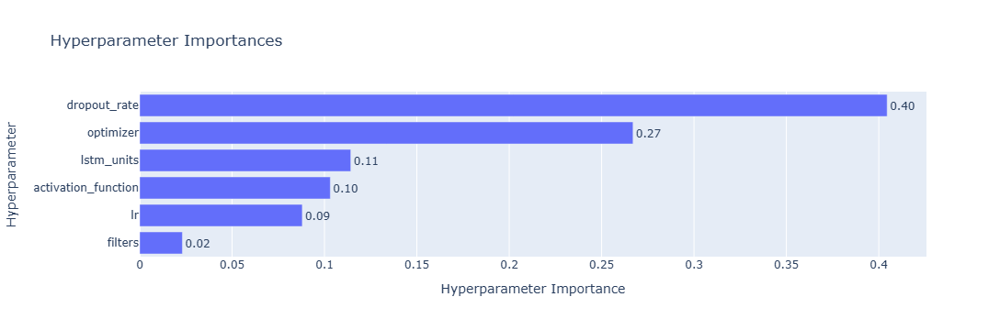

In [6]:
optuna.visualization.plot_param_importances(study)

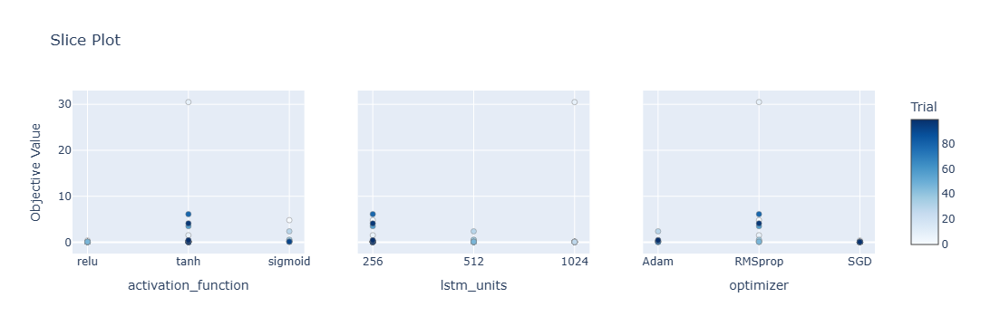

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

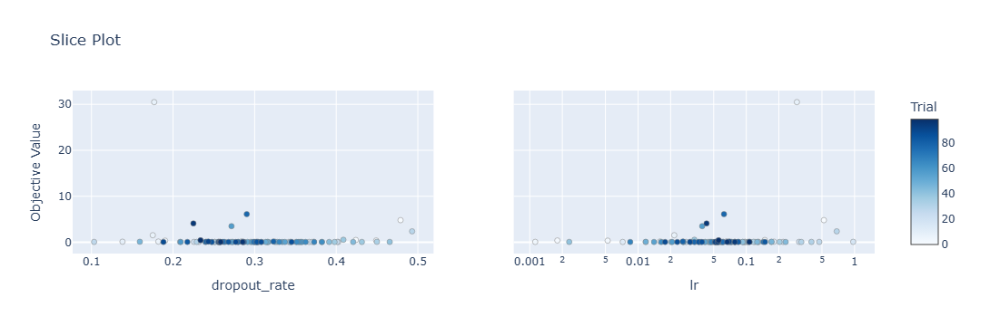

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 40s 257ms/step - loss: 0.1279 - accuracy: 0.5476 - mae: 0.1087 - rmse: 0.1279 - mape: 18.6057 - pearson: 0.6408 - val_loss: 0.1066 - val_accuracy: 0.6000 - val_mae: 0.0907 - val_rmse: 0.1066 - val_mape: 15.9125 - val_pearson: 0.5022
Epoch 2/100
84/84 [==============================] - 17s 208ms/step - loss: 0.0879 - accuracy: 0.5952 - mae: 0.0699 - rmse: 0.0879 - mape: 12.2606 - pearson: 0.6705 - val_loss: 0.1122 - val_accuracy: 0.6000 - val_mae: 0.0831 - val_rmse: 0.1122 - val_mape: 15.2434 - val_pearson: 0.7640
Epoch 3/100
84/84 [==============================] - 18s 211ms/step - loss: 0.0892 - accuracy: 0.6548 - mae: 0.0726 - rmse: 0.0892 - mape: 12.6823 - pearson: 0.6900

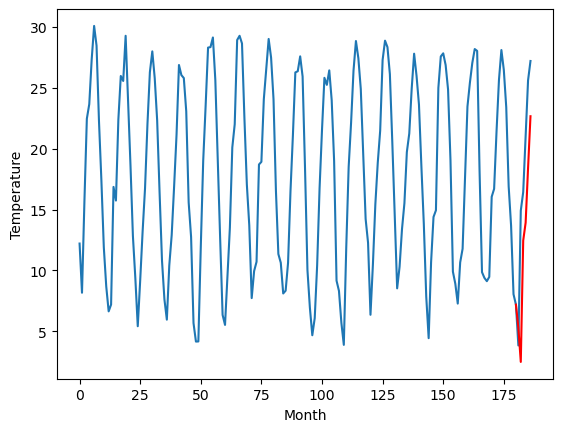

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		13.08		0.21
12.78		13.15		0.37
17.84		18.41		0.57
19.24		19.86		0.62
23.26		24.08		0.82
26.74		26.56		-0.18
[180, 181, 182, 183, 184, 185, 186]
[13.23, 13.08370800971985, 13.148346385955811, 18.407241306304932, 19.86473473072052, 24.078774056434632, 26.55805738925934]


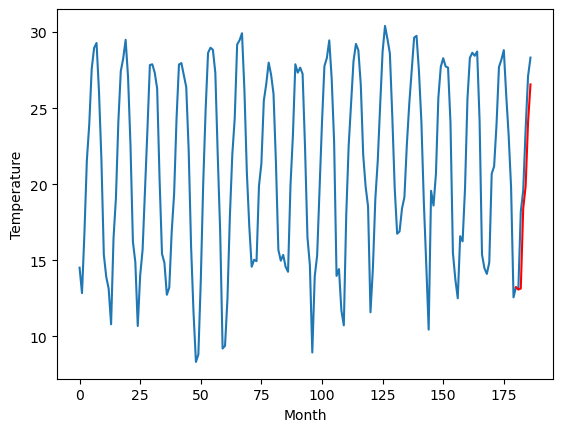

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		14.98		-0.36
16.20		14.54		-1.66
22.18		20.72		-1.46
23.82		22.48		-1.34
27.80		26.82		-0.98
31.94		29.85		-2.09
[180, 181, 182, 183, 184, 185, 186]
[7.18, 14.975548793077468, 14.53678079366684, 20.72373433828354, 22.48293920278549, 26.82122607946396, 29.848453481197357]


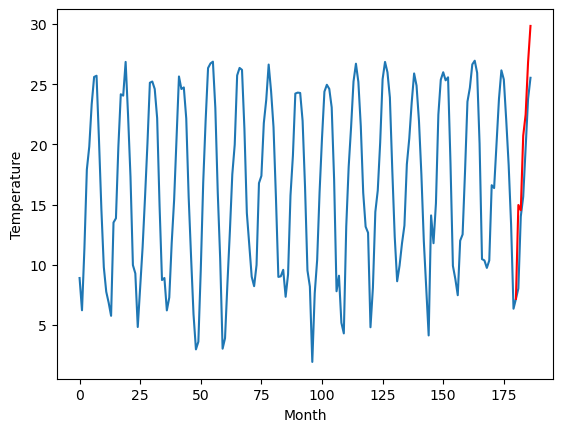

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		9.59		0.59
7.43		8.43		1.00
15.34		15.69		0.35
17.13		16.88		-0.25
21.10		21.14		0.04
24.38		24.17		-0.21
[180, 181, 182, 183, 184, 185, 186]
[11.46, 9.594045195579529, 8.432074699401856, 15.694687995910645, 16.883729014396668, 21.136964831352234, 24.174646887779236]


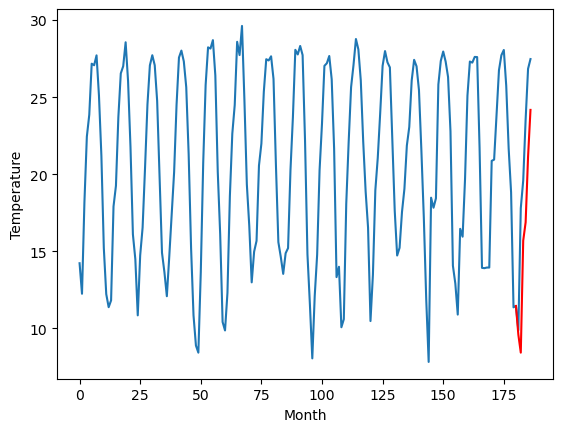

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		14.33		0.98
10.26		11.28		1.02
20.16		21.33		1.17
22.09		22.87		0.78
25.95		27.40		1.45
31.15		31.85		0.70
[180, 181, 182, 183, 184, 185, 186]
[9.27, 14.326820175647736, 11.2784579205513, 21.334472935199738, 22.87062637090683, 27.403583447933197, 31.847039620876313]


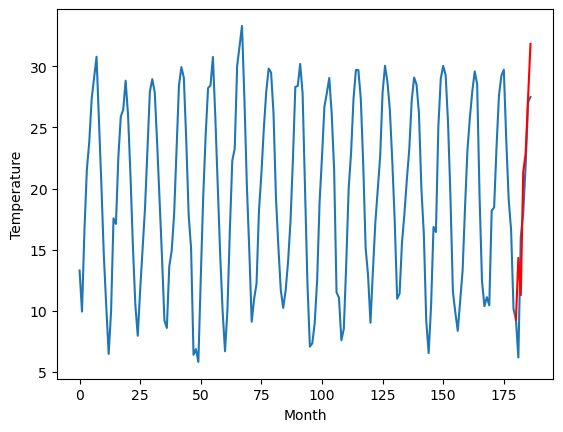

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		13.54		2.02
12.17		13.41		1.24
17.07		18.93		1.86
20.44		21.30		0.86
23.95		25.78		1.83
28.52		29.02		0.50
[180, 181, 182, 183, 184, 185, 186]
[7.77, 13.535629066824914, 13.408369693160058, 18.92780748307705, 21.30104270875454, 25.780632171034814, 29.019008311629296]


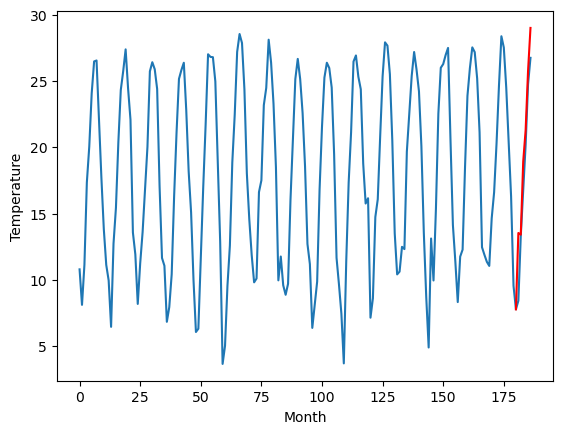

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		11.03		0.82
10.85		10.53		-0.32
17.83		16.71		-1.12
18.86		18.91		0.05
22.57		23.40		0.83
26.90		26.78		-0.12
[180, 181, 182, 183, 184, 185, 186]
[6.59, 11.027595170736312, 10.528951086997985, 16.70785752773285, 18.911343970298766, 23.395990290641784, 26.777333178520202]


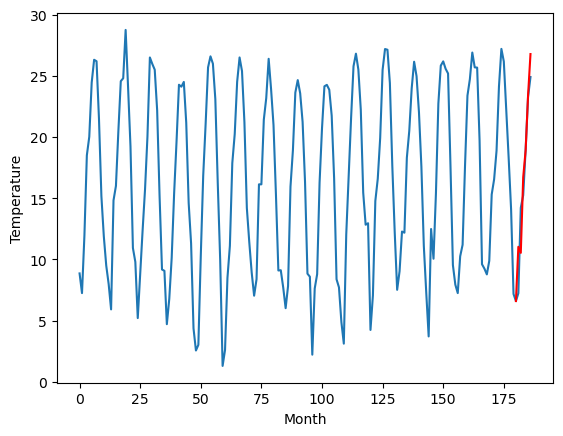

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		8.82		0.91
8.53		8.06		-0.47
15.05		14.62		-0.43
18.68		17.14		-1.54
21.70		21.74		0.04
26.49		25.51		-0.98
[180, 181, 182, 183, 184, 185, 186]
[5.3, 8.824134564399719, 8.059053218364715, 14.6189511179924, 17.141375100612642, 21.735713517665864, 25.50680140256882]


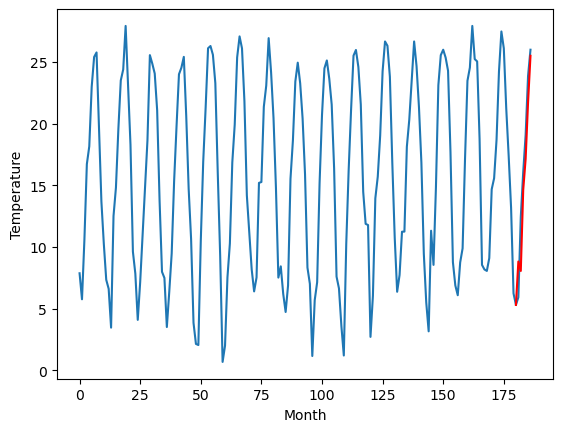

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		7.30		0.22
2.81		3.03		0.22
15.28		15.19		-0.09
17.88		17.09		-0.79
22.57		21.84		-0.73
28.76		27.28		-1.48
[180, 181, 182, 183, 184, 185, 186]
[3.1, 7.295805866718292, 3.0291270565986634, 15.19349854707718, 17.08834534406662, 21.8416894030571, 27.28292828321457]


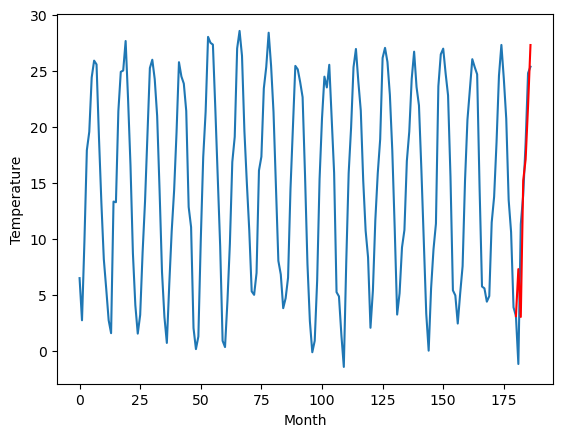

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		5.60		0.70
2.73		2.33		-0.40
13.48		12.94		-0.54
16.54		15.68		-0.86
21.01		20.59		-0.42
27.49		26.05		-1.44
[180, 181, 182, 183, 184, 185, 186]
[0.6, 5.596953799724579, 2.326821496486664, 12.935666253566742, 15.679293324947357, 20.591199567317965, 26.052195718288424]


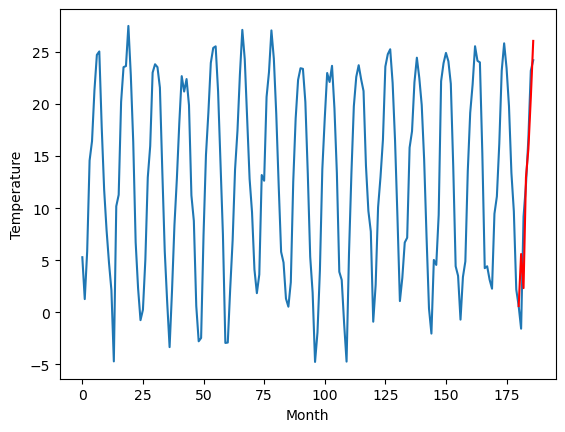

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		3.99		0.31
-0.63		-0.22		0.41
11.10		11.49		0.39
15.07		14.83		-0.24
20.22		20.05		-0.17
27.53		26.50		-1.03
[180, 181, 182, 183, 184, 185, 186]
[-0.75, 3.9926289701461792, -0.22238453388214108, 11.486761965751647, 14.833962836265563, 20.053990759849547, 26.49821225643158]


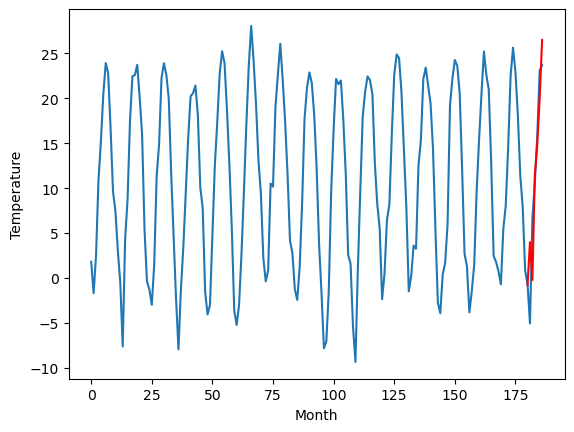

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   5.300180
1                 1   12.87  13.083708
2                 2   15.34  14.975549
3                 3    9.00   9.594045
4                 4   13.35  14.326820
5                 5   11.52  13.535629
6                 6   10.21  11.027595
7                 7    7.91   8.824135
8                 8    7.08   7.295806
9                 9    4.90   5.596954
10               10    3.68   3.992629


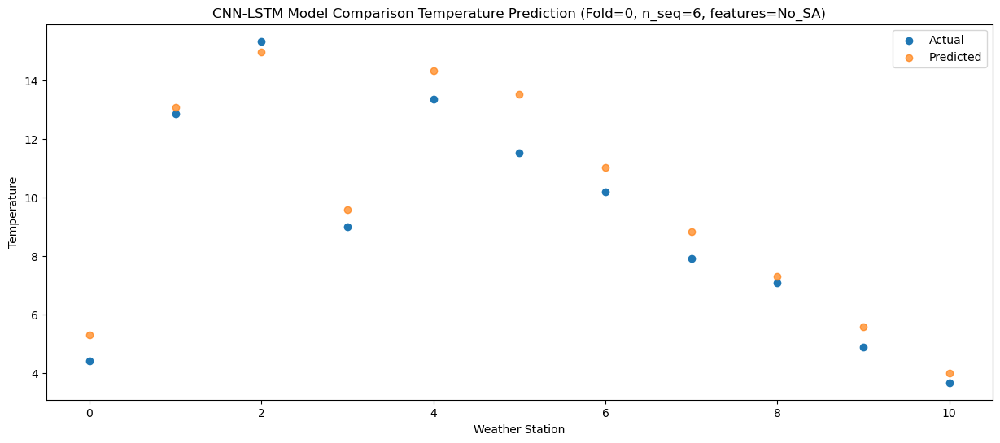

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   2.489446
1                 1   12.78  13.148346
2                 2   16.20  14.536781
3                 3    7.43   8.432075
4                 4   10.26  11.278458
5                 5   12.17  13.408370
6                 6   10.85  10.528951
7                 7    8.53   8.059053
8                 8    2.81   3.029127
9                 9    2.73   2.326821
10               10   -0.63  -0.222385


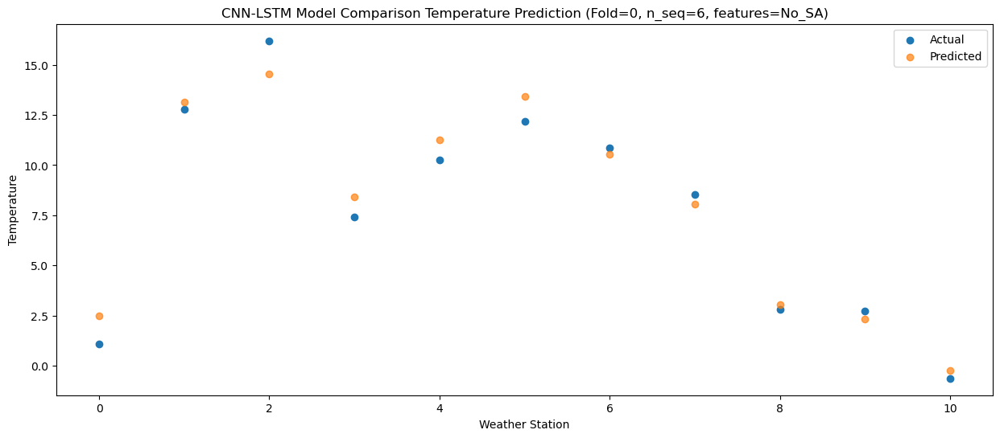

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  12.456219
1                 1   17.84  18.407241
2                 2   22.18  20.723734
3                 3   15.34  15.694688
4                 4   20.16  21.334473
5                 5   17.07  18.927807
6                 6   17.83  16.707858
7                 7   15.05  14.618951
8                 8   15.28  15.193499
9                 9   13.48  12.935666
10               10   11.10  11.486762


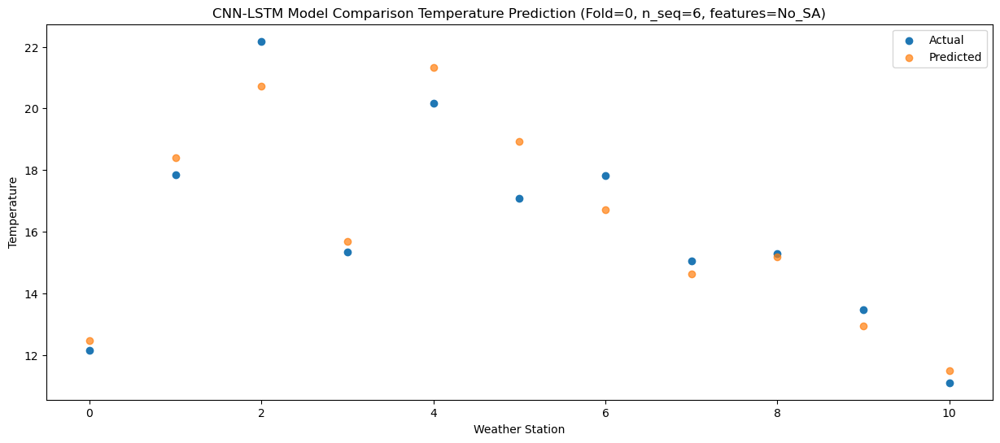

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  13.921546
1                 1   19.24  19.864735
2                 2   23.82  22.482939
3                 3   17.13  16.883729
4                 4   22.09  22.870626
5                 5   20.44  21.301043
6                 6   18.86  18.911344
7                 7   18.68  17.141375
8                 8   17.88  17.088345
9                 9   16.54  15.679293
10               10   15.07  14.833963


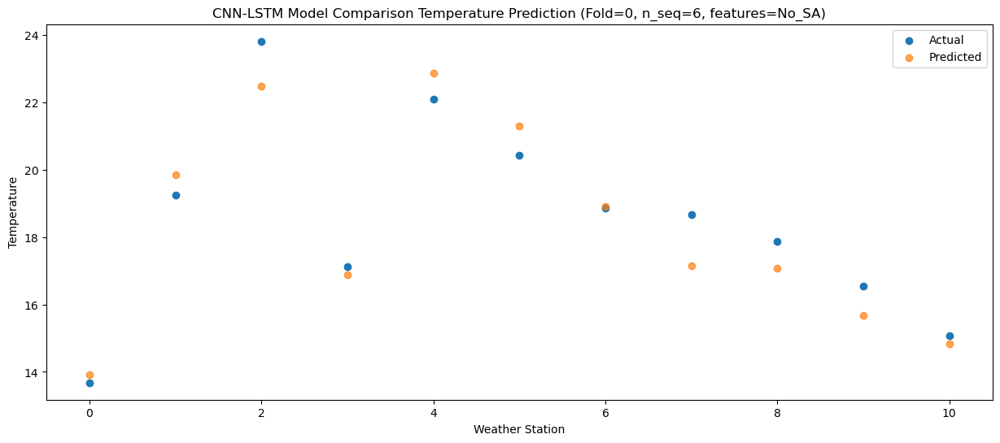

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  18.405128
1                 1   23.26  24.078774
2                 2   27.80  26.821226
3                 3   21.10  21.136965
4                 4   25.95  27.403583
5                 5   23.95  25.780632
6                 6   22.57  23.395990
7                 7   21.70  21.735714
8                 8   22.57  21.841689
9                 9   21.01  20.591200
10               10   20.22  20.053991


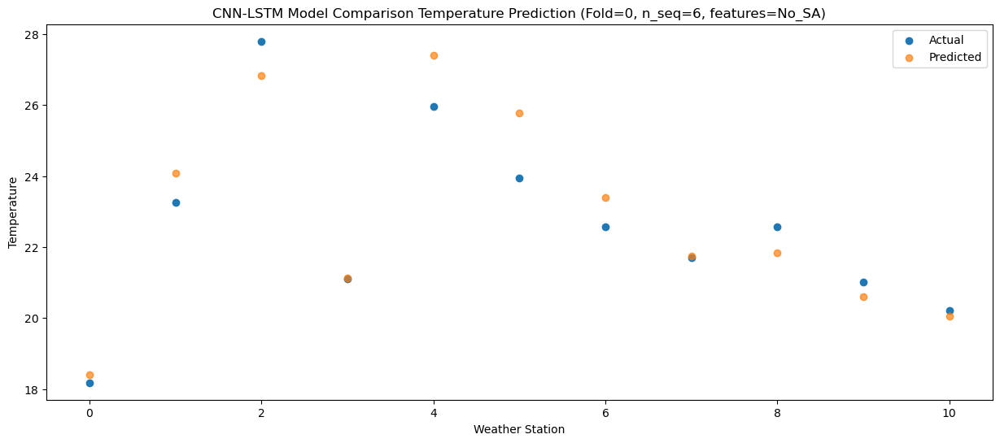

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  22.664792
1                 1   26.74  26.558057
2                 2   31.94  29.848453
3                 3   24.38  24.174647
4                 4   31.15  31.847040
5                 5   28.52  29.019008
6                 6   26.90  26.777333
7                 7   26.49  25.506801
8                 8   28.76  27.282928
9                 9   27.49  26.052196
10               10   27.53  26.498212


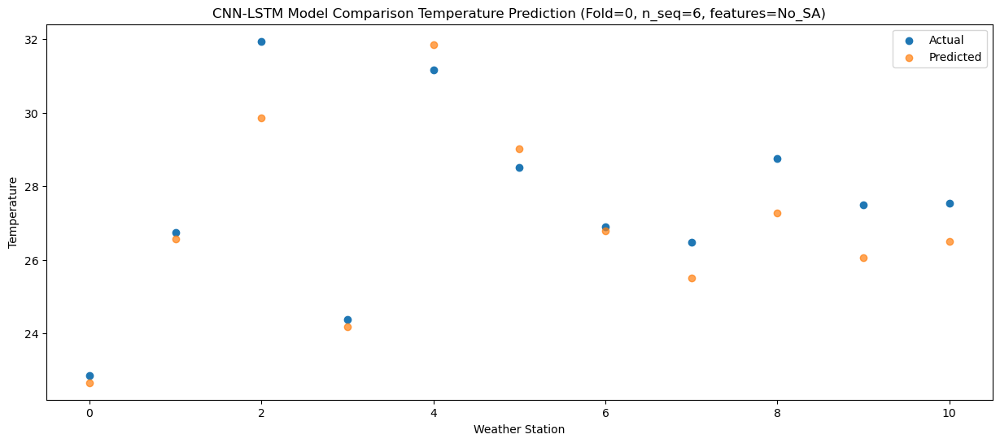

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]]
[[ 5.3001799  13.08370801 14.97554879  9.5940452  14.32682018 13.53562907
  11.02759517  8.82413456  7.29580587  5.5969538   3.99262897]
 [ 2.48944611 13.14834639 14.53678079  8.4320747  11.27845792 13.40836969
  10.52895109  8.05905322  3.02912706  2.3268215  -0.22238453]
 [12.45621914 18.40724131 20.72373434 15.694688   21.33447294 18.92780748
  16.70785753 14.61895112 15.19349855 12.93566625 11.48676197]
 [13.92154557 19.86473473 22.4829392  16.88372901 22.87062637 21.30104271
  18.91134397 17.1413751  17.08834534 15.67929332 14.83396284]
 [18.40512806 24.07877406 26.82

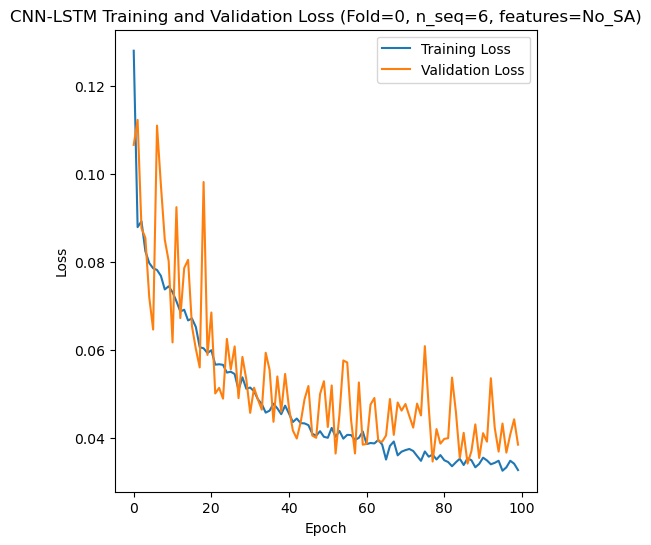

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 46s 295ms/step - loss: 0.1201 - accuracy: 0.5238 - mae: 0.1032 - rmse: 0.1201 - mape: 17.7642 - pearson: 0.6433 - val_loss: 0.0754 - val_accuracy: 0.8000 - val_mae: 0.0610 - val_rmse: 0.0754 - val_mape: 11.0188 - val_pearson: 0.8285
Epoch 2/100
84/84 [==============================] - 19s 224ms/step - loss: 0.0912 - accuracy: 0.5595 - mae: 0.0752 - rmse: 0.0912 - mape: 12.9753 - pearson: 0.6888 - val_loss: 0.0723 - val_accuracy: 0.8000 - val_mae: 0.0599 - val_rmse: 0.0723 - val_mape: 10.1904 - val_pearson: 0.8153
Epoch 3/100
84/84 [==============================] - 19s 223ms/step - loss: 0.0852 - accuracy: 0.5952 - mae: 0.0688 - rmse: 0.0852 - mape: 12.0665 - pearson: 0.7120

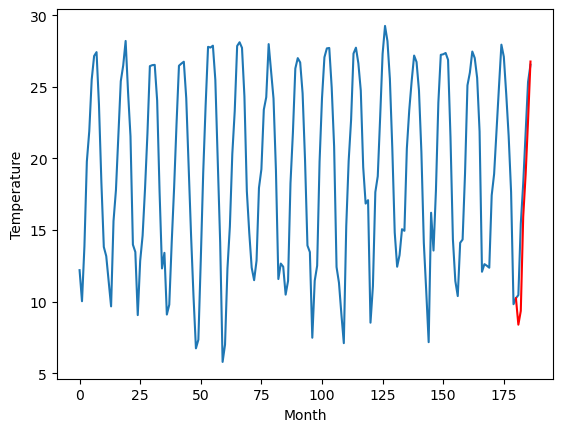

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		12.37		0.37
12.66		12.36		-0.30
19.43		20.66		1.23
21.57		23.49		1.92
25.30		27.41		2.11
29.44		32.08		2.64
[180, 181, 182, 183, 184, 185, 186]
[6.41, 12.370865401625633, 12.356271184794604, 20.657939351908862, 23.489051259867846, 27.407282747142016, 32.07909718882293]


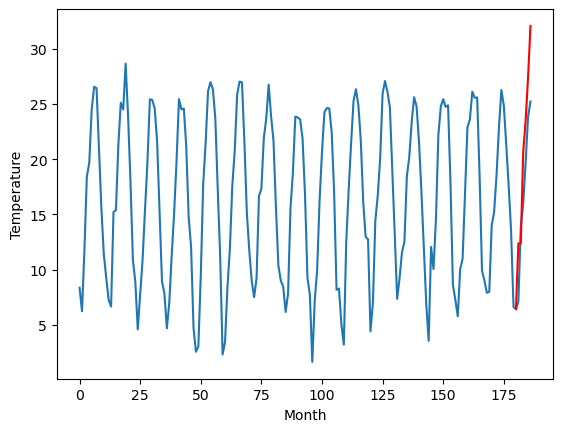

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		8.76		-0.01
9.26		8.56		-0.70
16.32		17.24		0.92
17.72		19.68		1.96
21.84		23.55		1.71
25.72		28.07		2.35
[180, 181, 182, 183, 184, 185, 186]
[7.6, 8.756493991613388, 8.555980315804481, 17.238048186898233, 19.68228112757206, 23.55112229883671, 28.072995296120645]


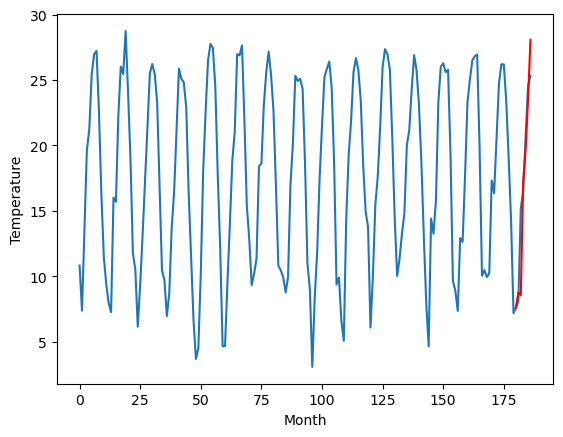

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		11.29		0.57
9.13		9.90		0.77
16.50		19.87		3.37
18.84		22.33		3.49
22.73		26.35		3.62
26.62		31.61		4.99
[180, 181, 182, 183, 184, 185, 186]
[11.89, 11.294113881587982, 9.900927908420563, 19.87226331949234, 22.327209837436676, 26.34872234582901, 31.605042822360993]


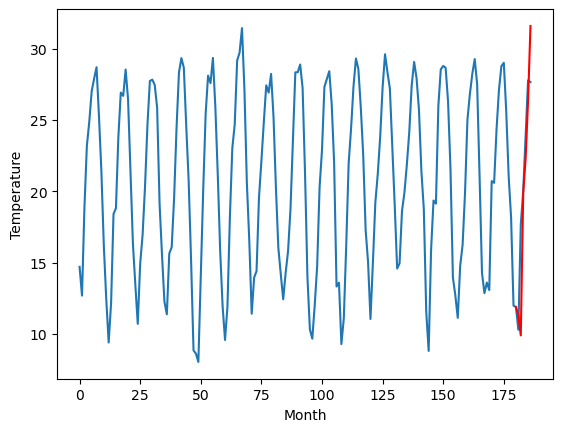

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		15.19		0.49
13.00		13.60		0.60
20.61		23.91		3.30
22.91		26.28		3.37
27.03		30.32		3.29
30.50		35.64		5.14
[180, 181, 182, 183, 184, 185, 186]
[10.96, 15.185241005420686, 13.601982138156892, 23.91060068368912, 26.282756111621858, 30.317852756977082, 35.64250781297684]


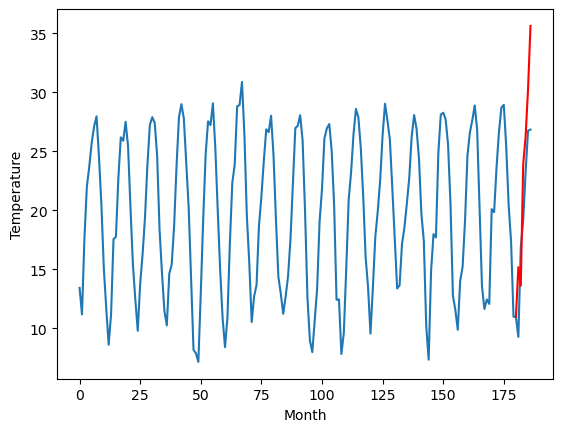

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		13.86		1.95
12.29		12.73		0.44
19.63		21.44		1.81
21.90		24.77		2.87
27.49		28.89		1.40
31.76		34.59		2.83
[180, 181, 182, 183, 184, 185, 186]
[7.75, 13.859298123121262, 12.734080089330673, 21.442255748510362, 24.770582212209703, 28.891272081136705, 34.58545495390892]


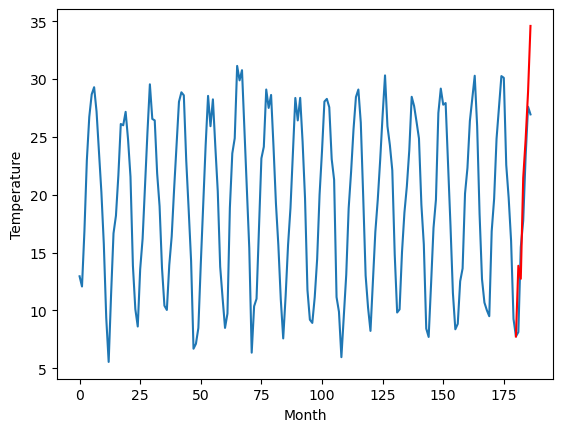

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		13.08		0.33
13.53		13.22		-0.31
19.81		21.25		1.44
22.38		24.21		1.83
26.15		28.13		1.98
30.16		32.77		2.61
[180, 181, 182, 183, 184, 185, 186]
[6.17, 13.076840844750404, 13.223915231227874, 21.250234735012054, 24.211076152324676, 28.129640233516692, 32.77449954748154]


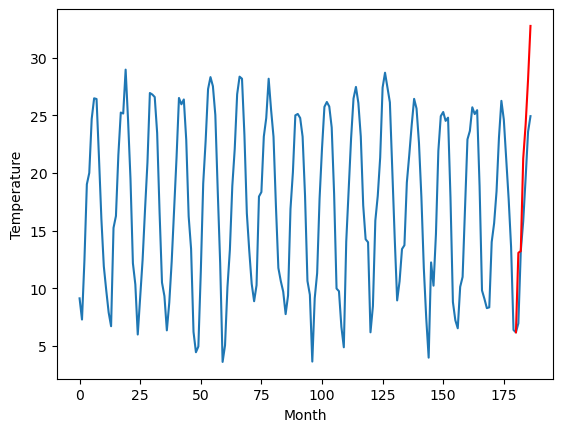

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		8.94		0.13
5.81		5.72		-0.09
17.13		18.80		1.67
18.84		21.27		2.43
23.50		25.65		2.15
29.58		32.05		2.47
[180, 181, 182, 183, 184, 185, 186]
[4.57, 8.942781279683112, 5.722752640843391, 18.80467707931995, 21.269235442280767, 25.64808256447315, 32.04746420204639]


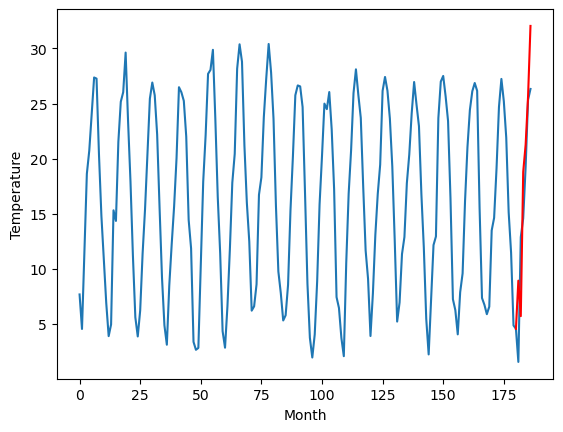

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		7.57		0.23
2.56		3.65		1.09
15.12		17.13		2.01
16.92		19.88		2.96
21.73		24.41		2.68
27.76		31.45		3.69
[180, 181, 182, 183, 184, 185, 186]
[5.46, 7.56586297094822, 3.646420794129372, 17.133496599793435, 19.882745104432107, 24.41074879705906, 31.454984980225564]


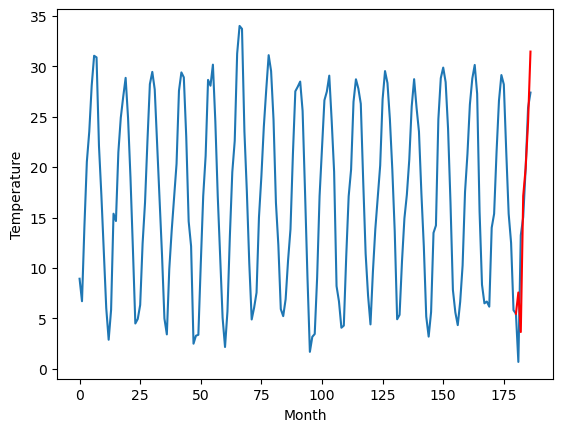

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		8.95		-0.09
4.67		5.55		0.88
15.38		17.52		2.14
19.14		20.89		1.75
23.69		25.43		1.74
30.80		32.59		1.79
[180, 181, 182, 183, 184, 185, 186]
[5.42, 8.946775574535131, 5.553533215373754, 17.516425747722387, 20.894973893016576, 25.434894699901342, 32.593534607738256]


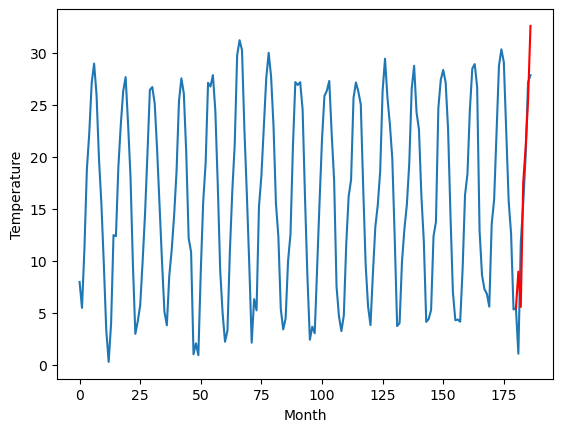

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.76		0.64
5.16		6.65		1.49
12.38		14.16		1.78
17.03		19.33		2.30
21.57		23.77		2.20
27.66		30.06		2.40
[180, 181, 182, 183, 184, 185, 186]
[2.17, 6.7568868017196655, 6.650186999738216, 14.161322577893735, 19.332141860425473, 23.772605403363706, 30.055448516309262]


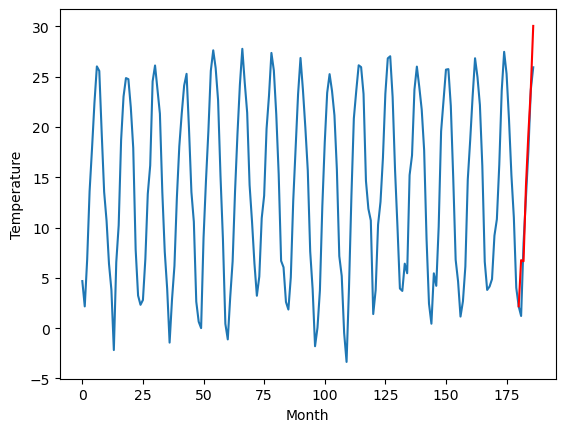

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   8.392439
1                 1   12.00  12.370865
2                 2    8.77   8.756494
3                 3   10.72  11.294114
4                 4   14.70  15.185241
5                 5   11.91  13.859298
6                 6   12.75  13.076841
7                 7    8.81   8.942781
8                 8    7.34   7.565863
9                 9    9.04   8.946776
10               10    6.12   6.756887


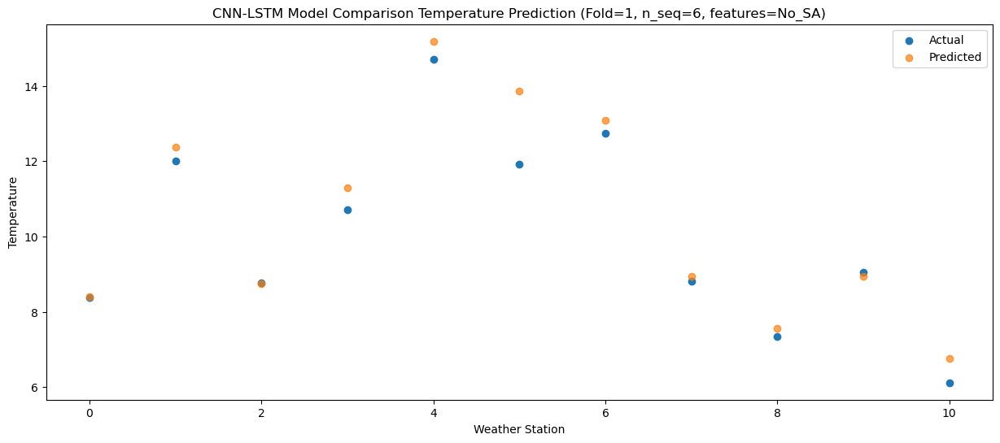

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   9.353510
1                 1   12.66  12.356271
2                 2    9.26   8.555980
3                 3    9.13   9.900928
4                 4   13.00  13.601982
5                 5   12.29  12.734080
6                 6   13.53  13.223915
7                 7    5.81   5.722753
8                 8    2.56   3.646421
9                 9    4.67   5.553533
10               10    5.16   6.650187


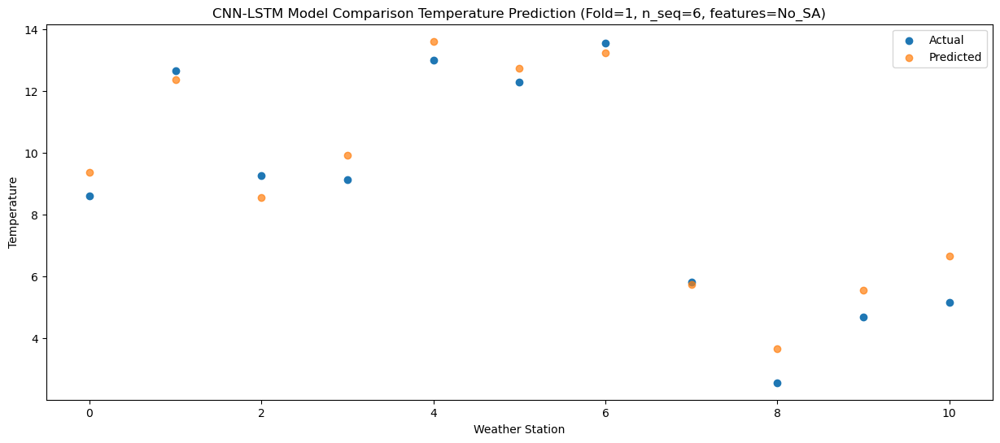

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  15.931728
1                 1   19.43  20.657939
2                 2   16.32  17.238048
3                 3   16.50  19.872263
4                 4   20.61  23.910601
5                 5   19.63  21.442256
6                 6   19.81  21.250235
7                 7   17.13  18.804677
8                 8   15.12  17.133497
9                 9   15.38  17.516426
10               10   12.38  14.161323


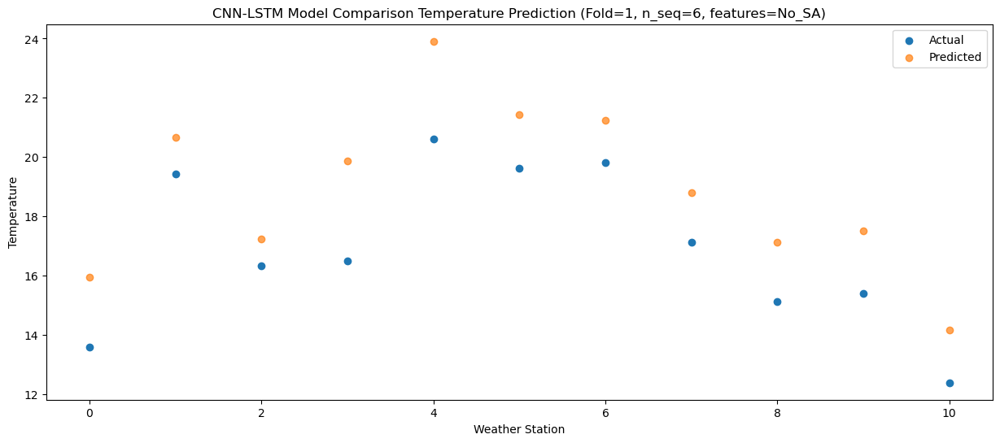

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  18.880591
1                 1   21.57  23.489051
2                 2   17.72  19.682281
3                 3   18.84  22.327210
4                 4   22.91  26.282756
5                 5   21.90  24.770582
6                 6   22.38  24.211076
7                 7   18.84  21.269235
8                 8   16.92  19.882745
9                 9   19.14  20.894974
10               10   17.03  19.332142


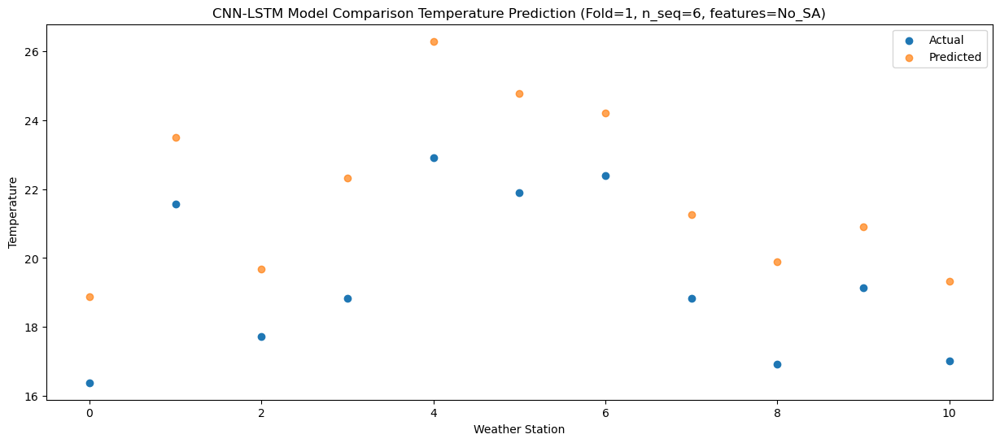

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  22.657601
1                 1   25.30  27.407283
2                 2   21.84  23.551122
3                 3   22.73  26.348722
4                 4   27.03  30.317853
5                 5   27.49  28.891272
6                 6   26.15  28.129640
7                 7   23.50  25.648083
8                 8   21.73  24.410749
9                 9   23.69  25.434895
10               10   21.57  23.772605


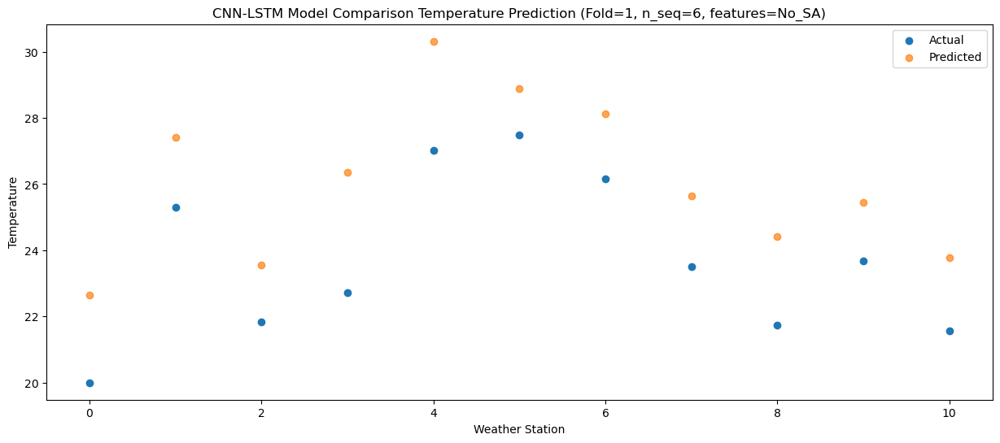

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  26.772847
1                 1   29.44  32.079097
2                 2   25.72  28.072995
3                 3   26.62  31.605043
4                 4   30.50  35.642508
5                 5   31.76  34.585455
6                 6   30.16  32.774500
7                 7   29.58  32.047464
8                 8   27.76  31.454985
9                 9   30.80  32.593535
10               10   27.66  30.055449


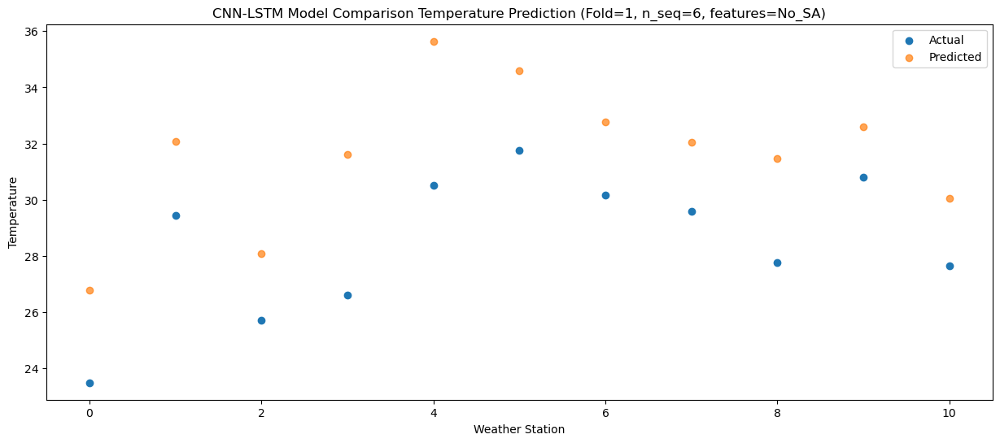

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]]
[[ 8.39243948 12.3708654   8.75649399 11.29411388 15.18524101 13.85929812
  13.07684084  8.94278128  7.56586297  8.94677557  6.7568868 ]
 [ 9.35351007 12.35627118  8.55598032  9.90092791 13.60198214 12.73408009
  13.22391523  5.72275264  3.64642079  5.55353322  6.650187  ]
 [15.93172758 20.65793935 17.23804819 19.87226332 23.91060068 21.44225575
  21.25023474 18.80467708 17.1334966  17.51642575 14.16132258]
 [18.88059132 23.48905126 19.68228113 22.32720984 26.28275611 24.77058221
  24.21107615 21.26923544 19.8827451  20.89497389 19.33214186]
 [22.65760105 27.40728275 23.55

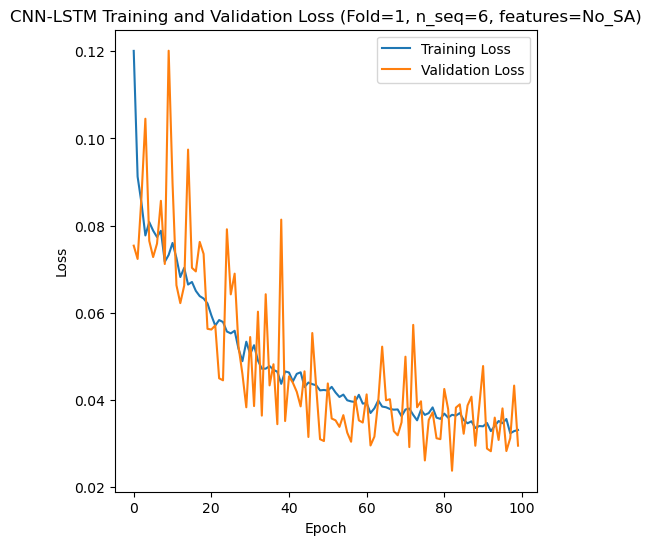

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 40s 275ms/step - loss: 0.1202 - accuracy: 0.6310 - mae: 0.1027 - rmse: 0.1202 - mape: 17.8194 - pearson: 0.6710 - val_loss: 0.0977 - val_accuracy: 0.9000 - val_mae: 0.0847 - val_rmse: 0.0977 - val_mape: 14.5827 - val_pearson: 0.7871
Epoch 2/100
84/84 [==============================] - 18s 215ms/step - loss: 0.0891 - accuracy: 0.6429 - mae: 0.0727 - rmse: 0.0891 - mape: 12.6595 - pearson: 0.7126 - val_loss: 0.0555 - val_accuracy: 0.9000 - val_mae: 0.0436 - val_rmse: 0.0555 - val_mape: 7.9040 - val_pearson: 0.9488
Epoch 3/100
84/84 [==============================] - 18s 220ms/step - loss: 0.0882 - accuracy: 0.6429 - mae: 0.0711 - rmse: 0.0882 - mape: 12.6212 - pearson: 0.7375 

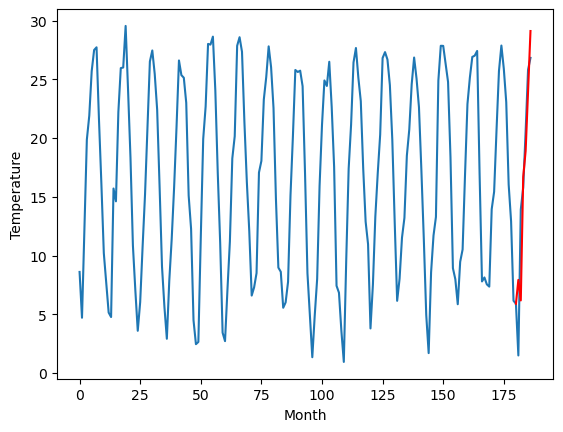

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.31		-0.22
4.49		5.54		1.05
14.68		16.19		1.51
18.44		19.18		0.74
23.62		24.52		0.90
30.87		31.05		0.18
[180, 181, 182, 183, 184, 185, 186]
[2.63, 8.308041409254074, 5.538352564573287, 16.192738131284713, 19.17748029589653, 24.519434527158737, 31.045353487730026]


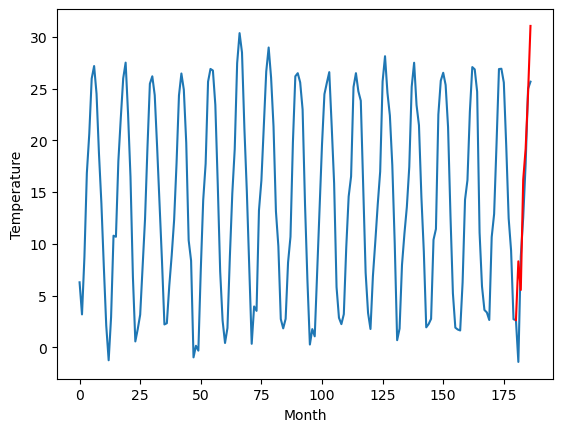

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		6.87		-0.07
9.67		9.86		0.19
11.48		12.71		1.23
13.29		14.69		1.40
16.87		19.20		2.33
18.09		21.44		3.35
[180, 181, 182, 183, 184, 185, 186]
[16.55, 6.870835511684418, 9.86226102590561, 12.706208674907685, 14.688394277095796, 19.19589015722275, 21.43677398443222]


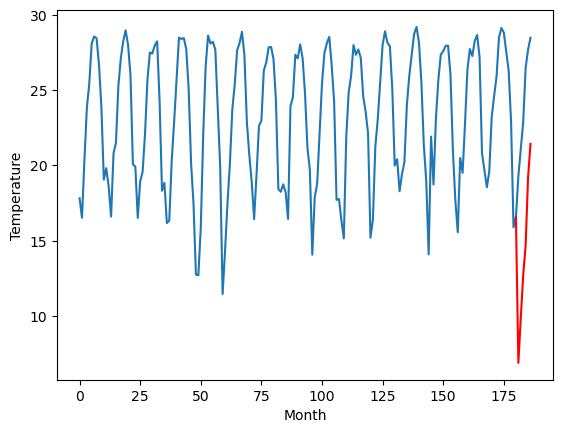

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		16.35		1.61
14.76		16.65		1.89
18.87		23.48		4.61
23.37		27.94		4.57
28.63		33.18		4.55
34.20		39.16		4.96
[180, 181, 182, 183, 184, 185, 186]
[-0.83, 16.352911777496338, 16.65187821507454, 23.476477004289627, 27.943340159654618, 33.18039021611214, 39.1610749733448]


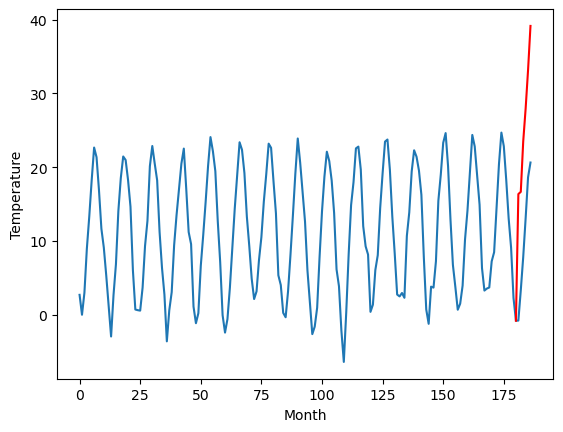

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		2.84		-0.19
2.29		3.86		1.57
9.62		10.20		0.58
10.49		11.85		1.36
14.96		16.52		1.56
18.44		19.56		1.12
[180, 181, 182, 183, 184, 185, 186]
[11.52, 2.843977921009064, 3.8580723929405214, 10.196231954097748, 11.84504031419754, 16.517530434131622, 19.55652713060379]


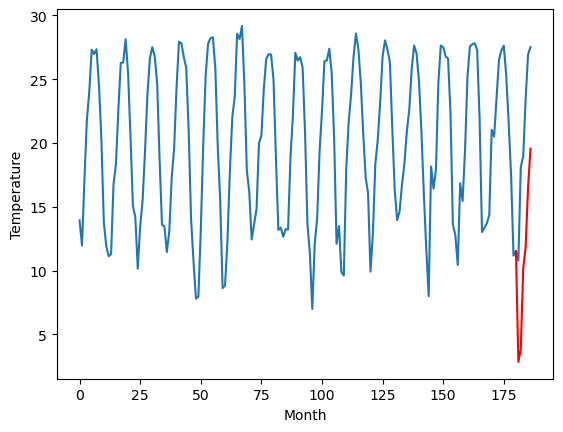

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.87		0.52
11.00		13.44		2.44
19.38		21.56		2.18
21.50		23.56		2.06
25.54		28.43		2.89
30.09		32.66		2.57
[180, 181, 182, 183, 184, 185, 186]
[11.47, 13.866300421357154, 13.44359682738781, 21.559429156184194, 23.564089524149892, 28.428179013133047, 32.66004871070385]


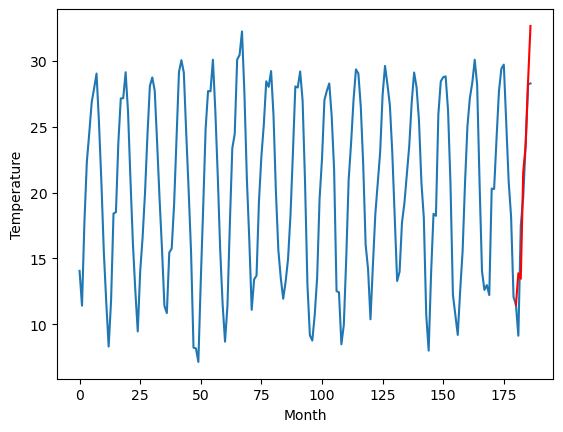

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.68		0.33
10.24		11.88		1.64
20.61		22.09		1.48
22.31		24.20		1.89
26.39		29.25		2.86
31.95		34.34		2.39
[180, 181, 182, 183, 184, 185, 186]
[7.75, 13.675277727842332, 11.87563254237175, 22.087547558546067, 24.204258459806443, 29.246182936429978, 34.34145118594169]


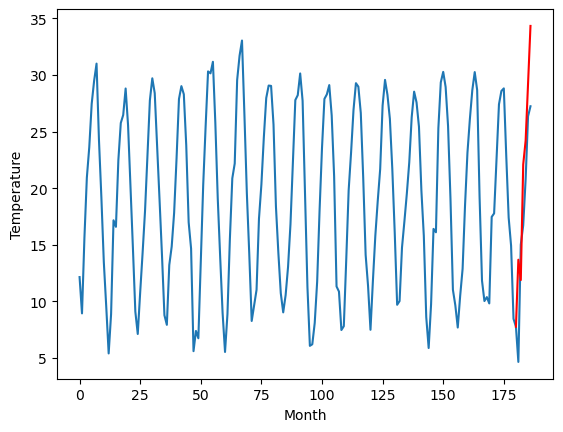

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		12.45		-0.23
15.60		13.63		-1.97
18.70		18.08		-0.62
25.36		21.43		-3.93
30.37		26.40		-3.97
35.36		31.08		-4.28
[180, 181, 182, 183, 184, 185, 186]
[4.9, 12.44580073595047, 13.628737404346467, 18.08328385591507, 21.42612095117569, 26.401933386325837, 31.076046183109284]


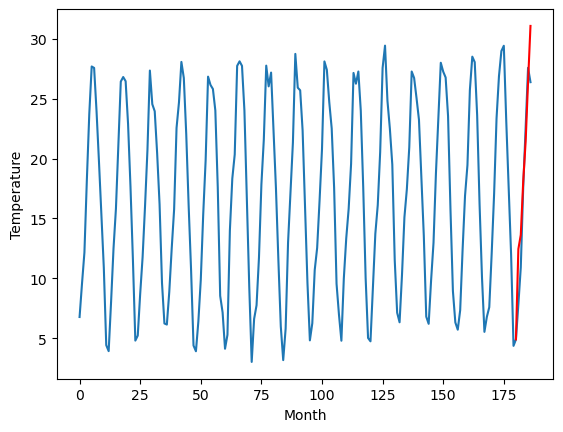

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		7.58		0.87
5.79		9.48		3.69
5.39		11.85		6.46
9.25		15.58		6.33
11.47		20.48		9.01
15.71		25.20		9.49
[180, 181, 182, 183, 184, 185, 186]
[14.14, 7.583494443893432, 9.48452009677887, 11.850008625984191, 15.576413531303405, 20.476069827079773, 25.196706194877624]


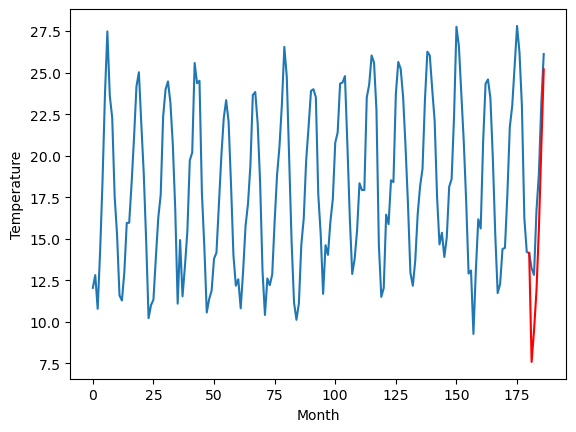

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		11.49		-0.14
12.13		12.23		0.10
19.01		19.16		0.15
21.80		21.66		-0.14
25.82		26.49		0.67
30.11		30.48		0.37
[180, 181, 182, 183, 184, 185, 186]
[5.55, 11.487188794612884, 12.23282305240631, 19.157771744728088, 21.655366339683532, 26.494312682151794, 30.480334439277648]


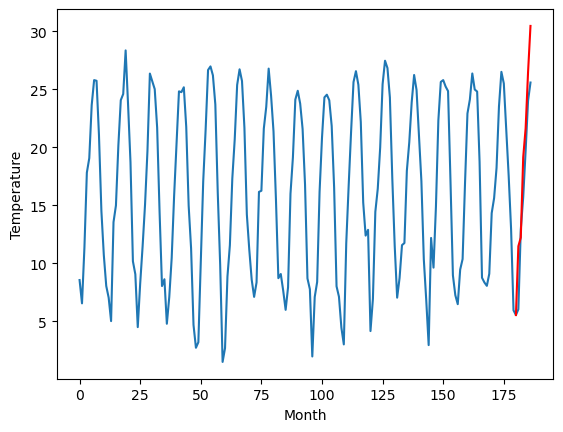

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		7.81		-1.09
10.25		8.06		-2.19
16.46		15.71		-0.75
18.43		18.43		-0.00
23.34		23.35		0.01
28.75		27.80		-0.95
[180, 181, 182, 183, 184, 185, 186]
[3.19, 7.8088018369674685, 8.063944823741913, 15.707310206890106, 18.425850636959076, 23.353375680446625, 27.800532586574555]


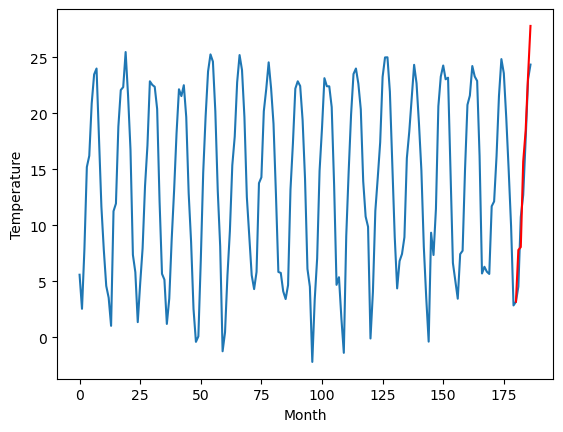

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   7.931678
1                 1    8.53   8.308041
2                 2    6.94   6.870836
3                 3   14.74  16.352912
4                 4    3.03   2.843978
5                 5   13.35  13.866300
6                 6   13.35  13.675278
7                 7   12.68  12.445801
8                 8    6.71   7.583494
9                 9   11.63  11.487189
10               10    8.90   7.808802


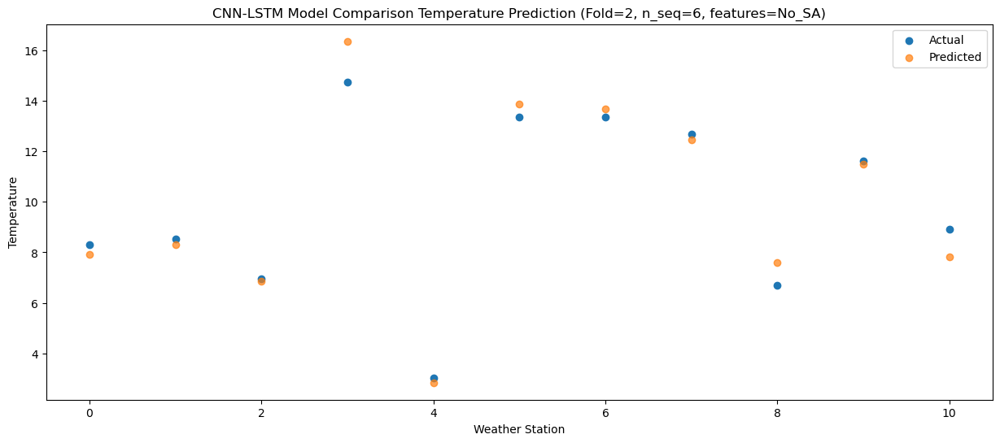

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   6.184592
1                 1    4.49   5.538353
2                 2    9.67   9.862261
3                 3   14.76  16.651878
4                 4    2.29   3.858072
5                 5   11.00  13.443597
6                 6   10.24  11.875633
7                 7   15.60  13.628737
8                 8    5.79   9.484520
9                 9   12.13  12.232823
10               10   10.25   8.063945


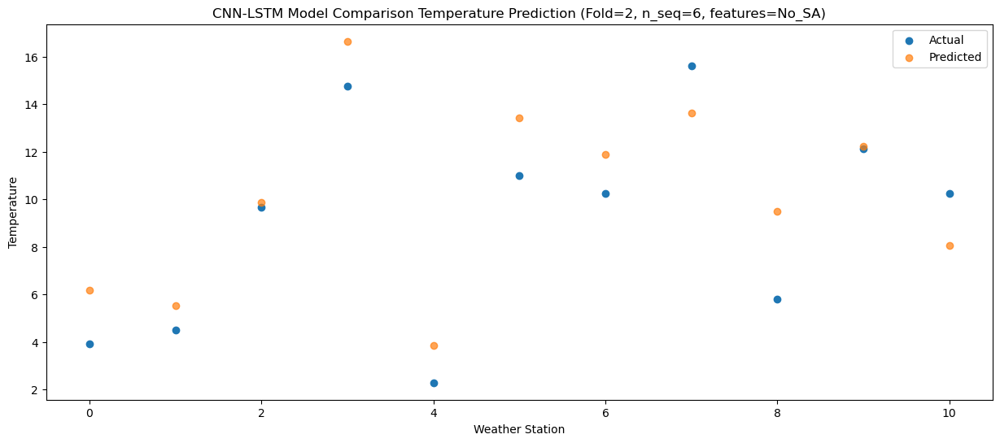

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  16.690489
1                 1   14.68  16.192738
2                 2   11.48  12.706209
3                 3   18.87  23.476477
4                 4    9.62  10.196232
5                 5   19.38  21.559429
6                 6   20.61  22.087548
7                 7   18.70  18.083284
8                 8    5.39  11.850009
9                 9   19.01  19.157772
10               10   16.46  15.707310


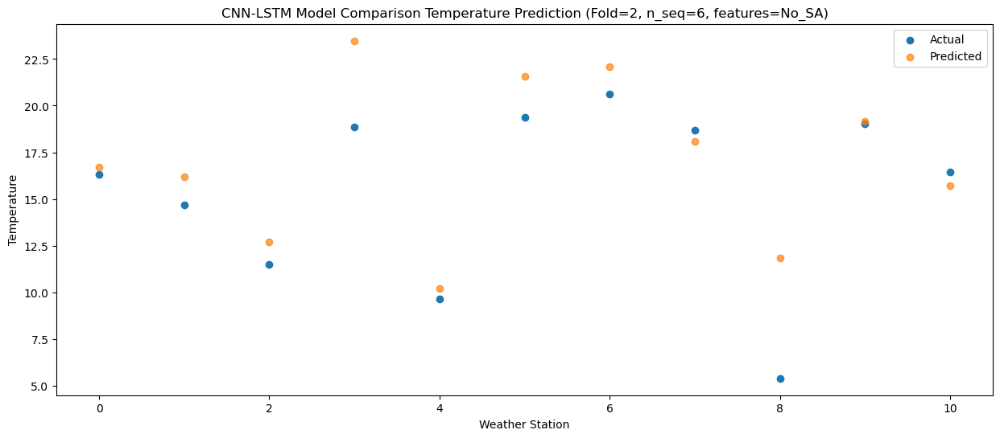

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  18.908084
1                 1   18.44  19.177480
2                 2   13.29  14.688394
3                 3   23.37  27.943340
4                 4   10.49  11.845040
5                 5   21.50  23.564090
6                 6   22.31  24.204258
7                 7   25.36  21.426121
8                 8    9.25  15.576414
9                 9   21.80  21.655366
10               10   18.43  18.425851


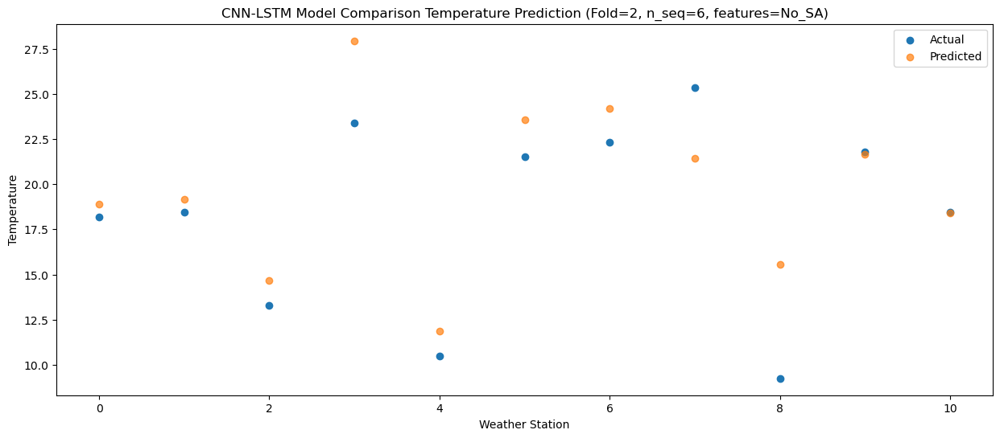

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  23.971851
1                 1   23.62  24.519435
2                 2   16.87  19.195890
3                 3   28.63  33.180390
4                 4   14.96  16.517530
5                 5   25.54  28.428179
6                 6   26.39  29.246183
7                 7   30.37  26.401933
8                 8   11.47  20.476070
9                 9   25.82  26.494313
10               10   23.34  23.353376


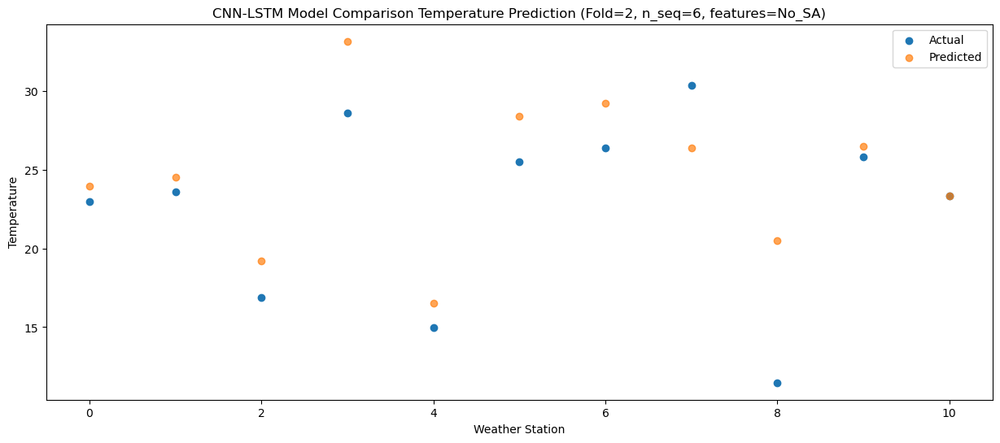

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  29.116174
1                 1   30.87  31.045353
2                 2   18.09  21.436774
3                 3   34.20  39.161075
4                 4   18.44  19.556527
5                 5   30.09  32.660049
6                 6   31.95  34.341451
7                 7   35.36  31.076046
8                 8   15.71  25.196706
9                 9   30.11  30.480334
10               10   28.75  27.800533


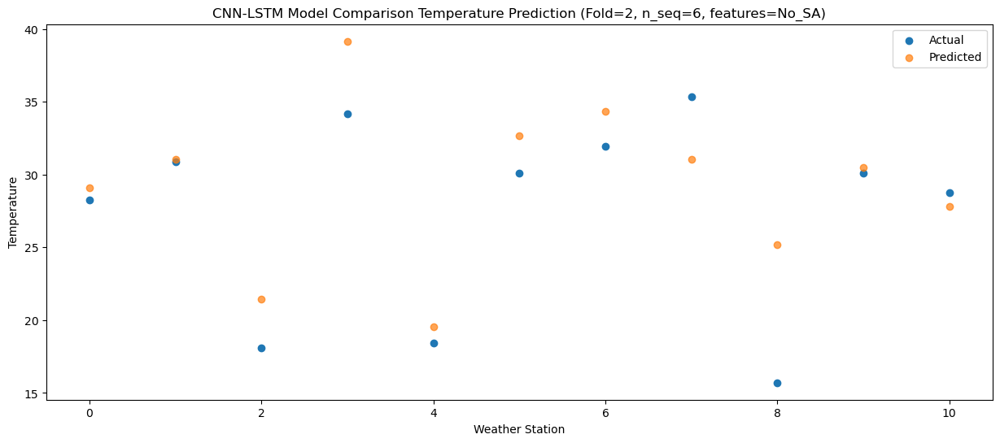

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]]
[[ 7.93167777  8.30804141  6.87083551 16.35291178  2.84397792 13.86630042
  13.67527773 12.44580074  7.58349444 11.48718879  7.80880184]
 [ 6.1845916   5.53835256  9.86226103 16.65187822  3.85807239 13.44359683
  11.87563254 13.6287374   9.4845201  12.23282305  8.06394482]
 [16.69048912 16.19273813 12.70620867 23.476477   10.19623195 21.55942916
  22.08754756 18.08328386 11.85000863 19.15777174 15.70731021]
 [18.90808374 19.1774803  14.68839428 27.94334016 11.84504031 23.56408952
  24.20425846 21.42612095 15.57641353 21.65536634 18.42585064]
 [23.97185118 24.51943453 19.19

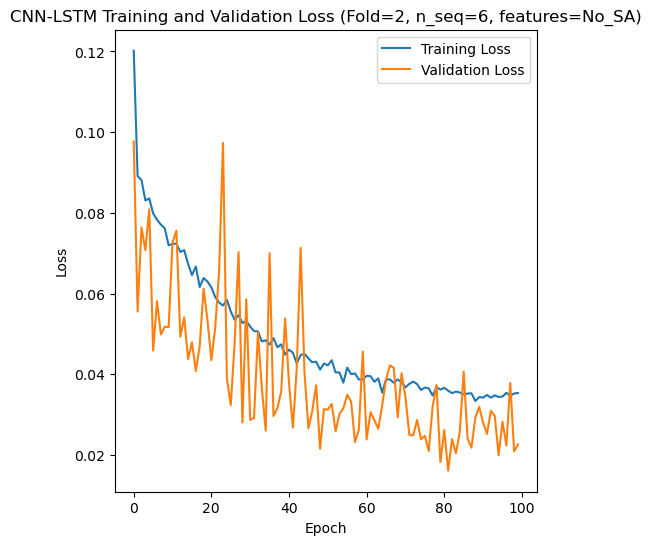

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 33s 226ms/step - loss: 0.1286 - accuracy: 0.6667 - mae: 0.1105 - rmse: 0.1286 - mape: 19.4407 - pearson: 0.6804 - val_loss: 0.0909 - val_accuracy: 0.7000 - val_mae: 0.0733 - val_rmse: 0.0909 - val_mape: 15.3103 - val_pearson: 0.7427
Epoch 2/100
84/84 [==============================] - 13s 158ms/step - loss: 0.0900 - accuracy: 0.7143 - mae: 0.0731 - rmse: 0.0900 - mape: 12.9878 - pearson: 0.7566 - val_loss: 0.1350 - val_accuracy: 0.7000 - val_mae: 0.1036 - val_rmse: 0.1350 - val_mape: 19.7388 - val_pearson: 0.3146
Epoch 3/100
84/84 [==============================] - 15s 179ms/step - loss: 0.0861 - accuracy: 0.6786 - mae: 0.0713 - rmse: 0.0861 - mape: 12.9045 - pearson: 0.7427

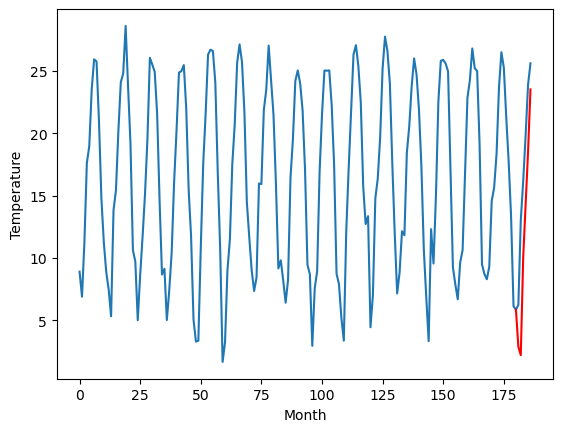

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		8.80		1.05
4.03		4.80		0.77
16.00		17.93		1.93
17.86		22.11		4.25
22.08		27.11		5.03
28.79		33.47		4.68
[180, 181, 182, 183, 184, 185, 186]
[3.2, 8.797410728037358, 4.796867133677006, 17.928411246836184, 22.11278844028711, 27.11006093174219, 33.471507312357424]


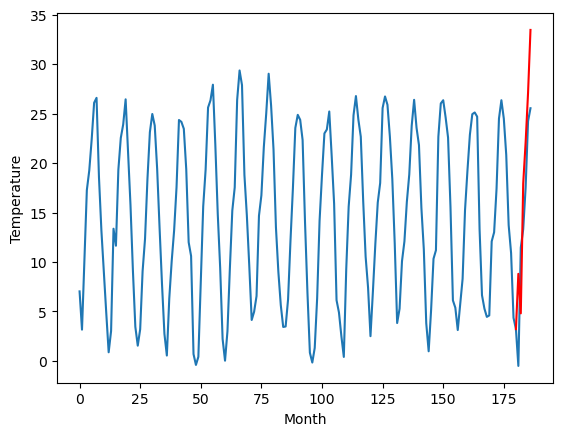

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		6.81		-1.47
10.58		7.09		-3.49
11.73		10.97		-0.76
17.46		16.41		-1.05
22.26		20.64		-1.62
27.11		26.51		-0.60
[180, 181, 182, 183, 184, 185, 186]
[8.48, 6.812614415287971, 7.0925302845239635, 10.973747764229774, 16.40717795908451, 20.643812690377235, 26.512590919137]


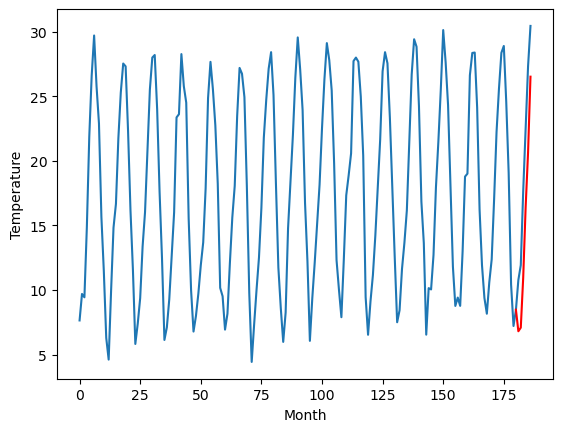

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		6.97		0.78
4.87		4.79		-0.08
15.08		15.05		-0.03
17.43		19.83		2.40
21.50		24.59		3.09
27.42		30.72		3.30
[180, 181, 182, 183, 184, 185, 186]
[1.55, 6.969322645664215, 4.793782913684845, 15.053614342212677, 19.82704278230667, 24.585748398303984, 30.724621021747588]


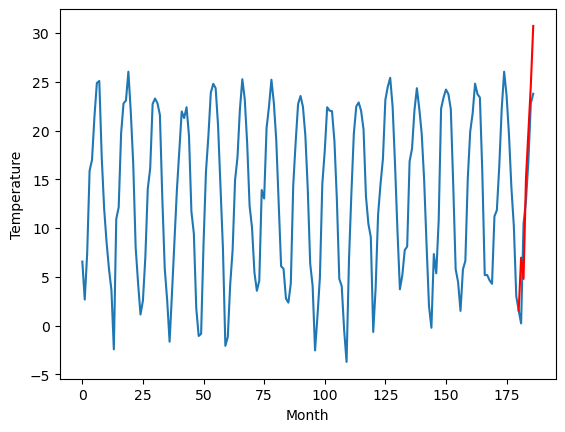

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		6.12		1.02
1.23		1.70		0.47
14.31		15.45		1.14
17.60		20.18		2.58
22.17		25.45		3.28
29.65		32.48		2.83
[180, 181, 182, 183, 184, 185, 186]
[1.08, 6.120111025571823, 1.701517142057419, 15.445202864408493, 20.18101219058037, 25.44928268313408, 32.481207884550095]


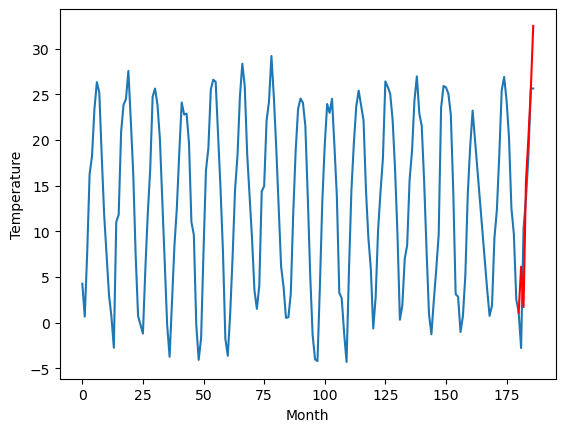

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		3.66		0.86
0.08		-0.05		-0.13
11.41		12.61		1.20
14.86		17.41		2.55
19.14		22.53		3.39
25.85		29.33		3.48
[180, 181, 182, 183, 184, 185, 186]
[0.21, 3.6554943919181824, -0.04530864953994751, 12.612514913082123, 17.410103738307953, 22.527909696102142, 29.33455318212509]


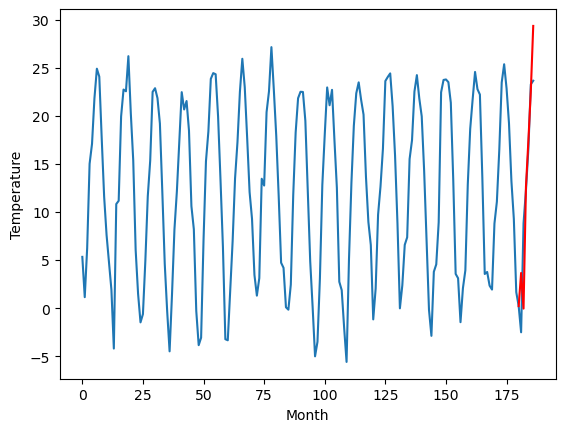

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		4.99		-0.61
5.70		4.18		-1.52
8.67		10.71		2.04
13.45		15.90		2.45
18.50		20.42		1.92
25.89		26.49		0.60
[180, 181, 182, 183, 184, 185, 186]
[-8.22, 4.994625823497772, 4.183668034076691, 10.70986832857132, 15.899472134113312, 20.421409027576445, 26.49306000947952]


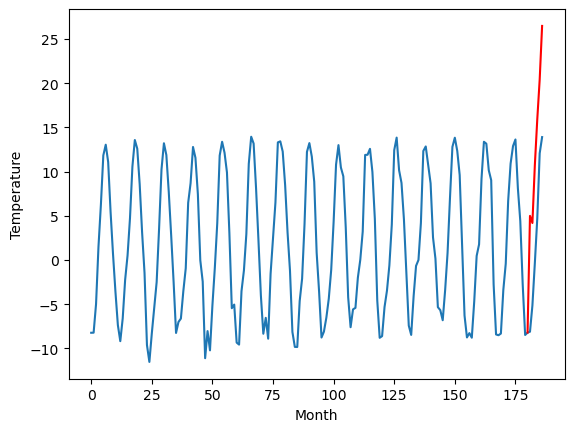

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-8.48		-0.79
-4.84		-8.63		-3.79
-3.24		-3.85		-0.61
4.73		1.58		-3.15
9.16		5.95		-3.21
16.80		11.99		-4.81
[180, 181, 182, 183, 184, 185, 186]
[10.04, -8.4773156696558, -8.62693954050541, -3.8459270054101946, 1.5775749629735945, 5.951564545035362, 11.990903133749962]


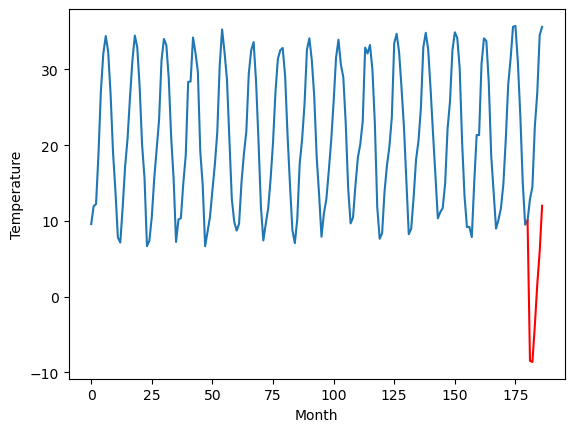

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.51		-1.28
11.72		10.15		-1.57
11.50		13.46		1.96
13.69		18.63		4.94
17.98		22.66		4.68
19.68		28.14		8.46
[180, 181, 182, 183, 184, 185, 186]
[9.17, 9.507410280108452, 10.145020834803582, 13.455288044810295, 18.626741997599602, 22.66189634025097, 28.139529339671135]


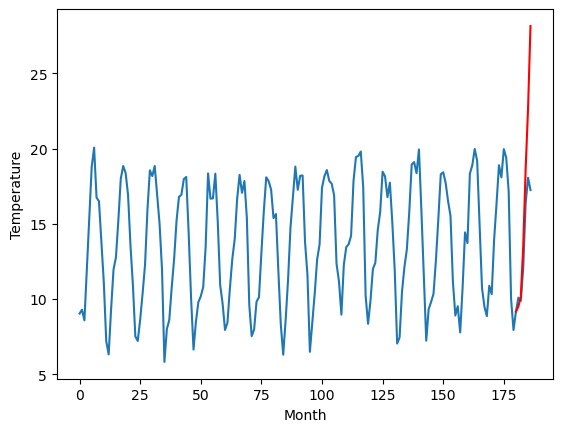

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		7.71		1.69
5.90		6.90		1.00
10.90		13.99		3.09
15.52		20.02		4.50
20.35		24.81		4.46
26.22		31.60		5.38
[180, 181, 182, 183, 184, 185, 186]
[0.94, 7.709420719146728, 6.90119920015335, 13.990035393238067, 20.015134193897246, 24.81412873506546, 31.60107312440872]


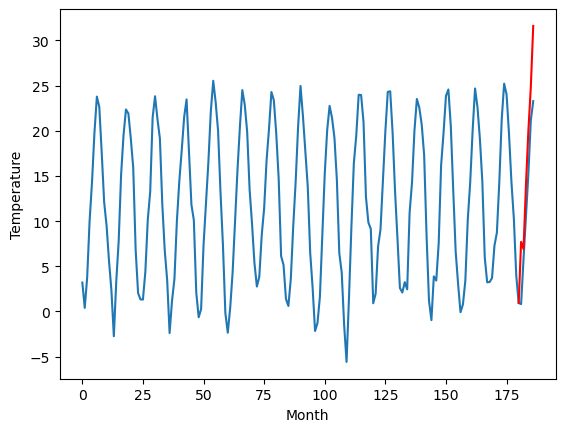

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		1.94		0.30
0.84		0.74		-0.10
8.03		8.76		0.73
12.90		14.56		1.66
17.16		19.38		2.22
23.33		26.10		2.77
[180, 181, 182, 183, 184, 185, 186]
[-0.13, 1.9377594709396364, 0.7449249744415285, 8.763780069351196, 14.556537103652953, 19.379035425186157, 26.09646315574646]


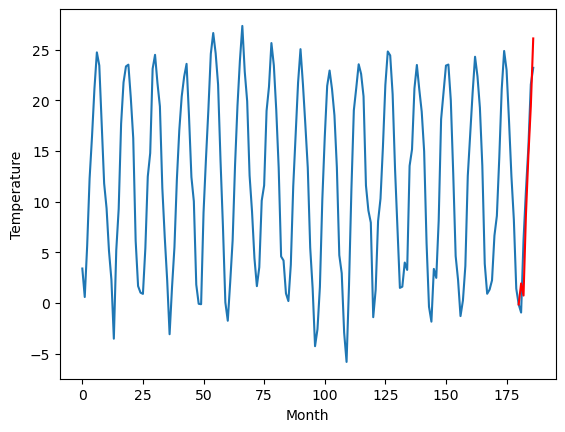

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   2.874324
1                 1    7.75   8.797411
2                 2    8.28   6.812614
3                 3    6.19   6.969323
4                 4    5.10   6.120111
5                 5    2.80   3.655494
6                 6    5.60   4.994626
7                 7   -7.69  -8.477316
8                 8   10.79   9.507410
9                 9    6.02   7.709421
10               10    1.64   1.937759


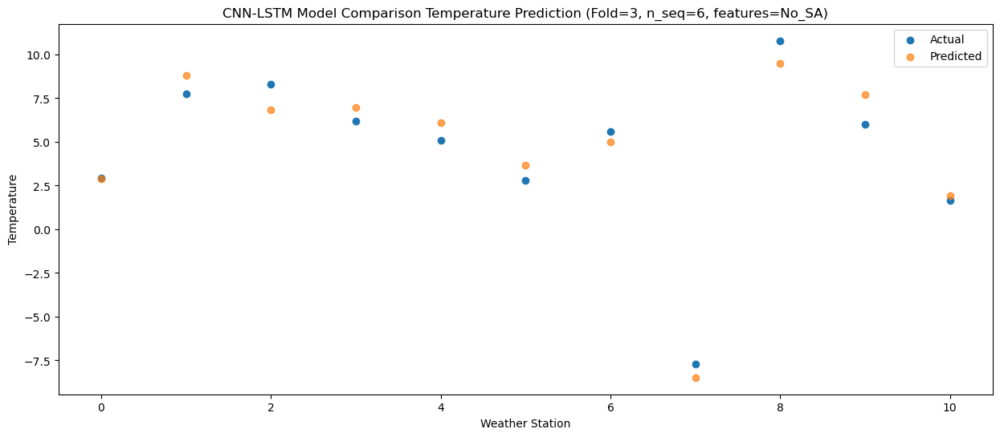

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29   2.204768
1                 1    4.03   4.796867
2                 2   10.58   7.092530
3                 3    4.87   4.793783
4                 4    1.23   1.701517
5                 5    0.08  -0.045309
6                 6    5.70   4.183668
7                 7   -4.84  -8.626940
8                 8   11.72  10.145021
9                 9    5.90   6.901199
10               10    0.84   0.744925


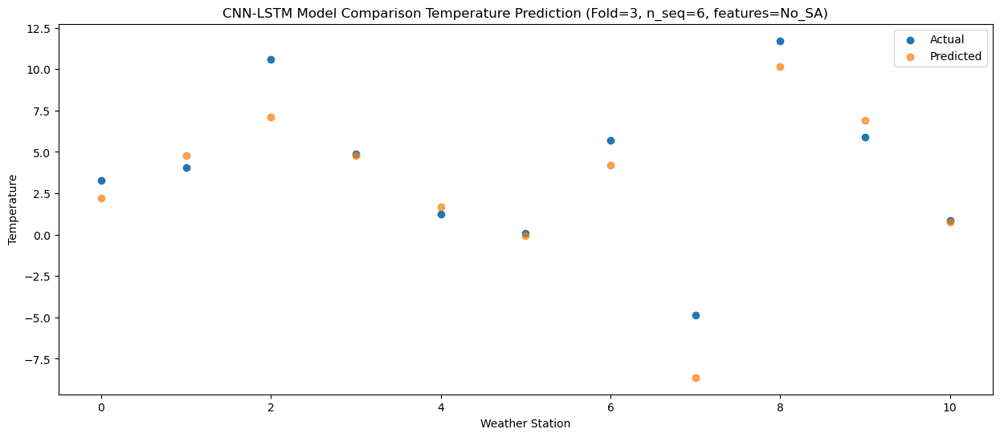

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09  10.054566
1                 1   16.00  17.928411
2                 2   11.73  10.973748
3                 3   15.08  15.053614
4                 4   14.31  15.445203
5                 5   11.41  12.612515
6                 6    8.67  10.709868
7                 7   -3.24  -3.845927
8                 8   11.50  13.455288
9                 9   10.90  13.990035
10               10    8.03   8.763780


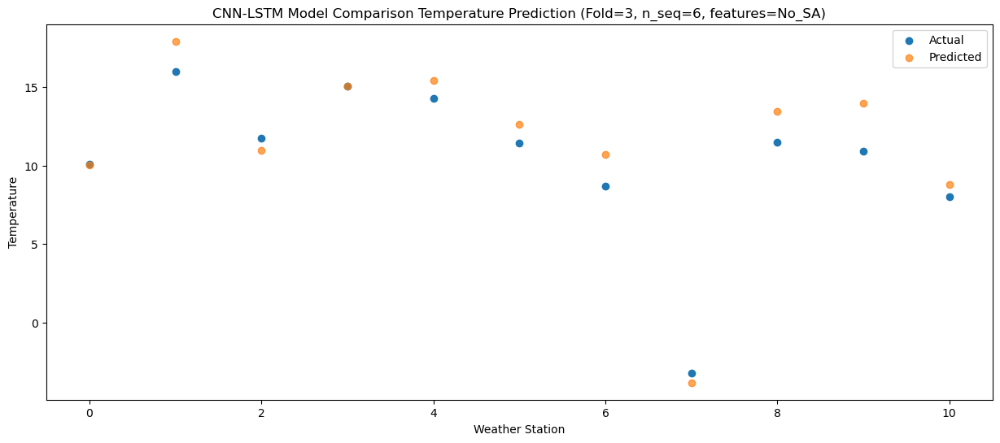

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  14.296547
1                 1   17.86  22.112788
2                 2   17.46  16.407178
3                 3   17.43  19.827043
4                 4   17.60  20.181012
5                 5   14.86  17.410104
6                 6   13.45  15.899472
7                 7    4.73   1.577575
8                 8   13.69  18.626742
9                 9   15.52  20.015134
10               10   12.90  14.556537


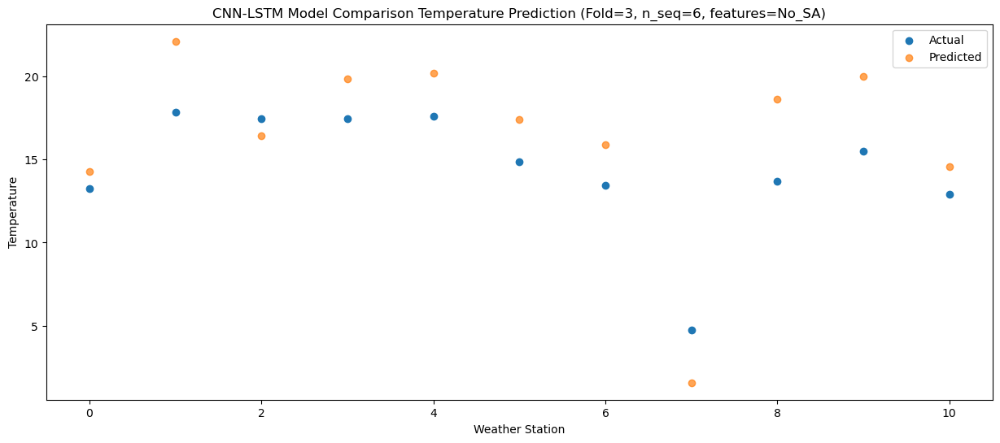

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  18.529813
1                 1   22.08  27.110061
2                 2   22.26  20.643813
3                 3   21.50  24.585748
4                 4   22.17  25.449283
5                 5   19.14  22.527910
6                 6   18.50  20.421409
7                 7    9.16   5.951565
8                 8   17.98  22.661896
9                 9   20.35  24.814129
10               10   17.16  19.379035


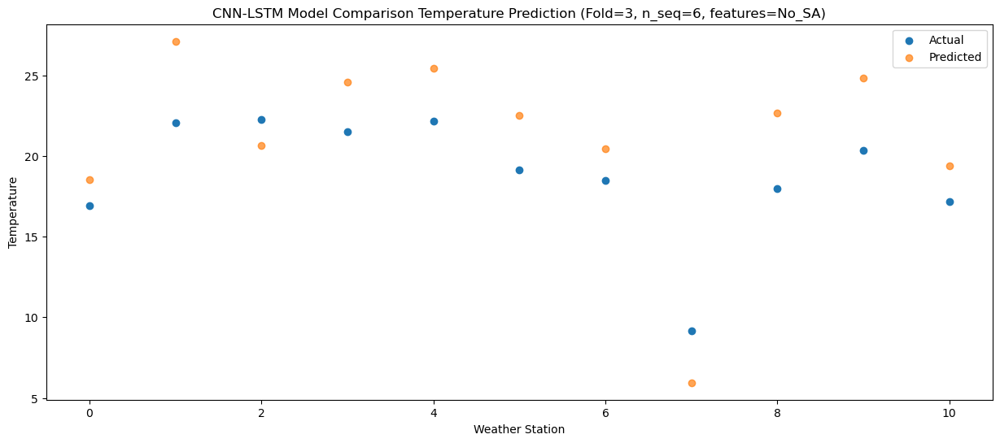

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  23.522275
1                 1   28.79  33.471507
2                 2   27.11  26.512591
3                 3   27.42  30.724621
4                 4   29.65  32.481208
5                 5   25.85  29.334553
6                 6   25.89  26.493060
7                 7   16.80  11.990903
8                 8   19.68  28.139529
9                 9   26.22  31.601073
10               10   23.33  26.096463


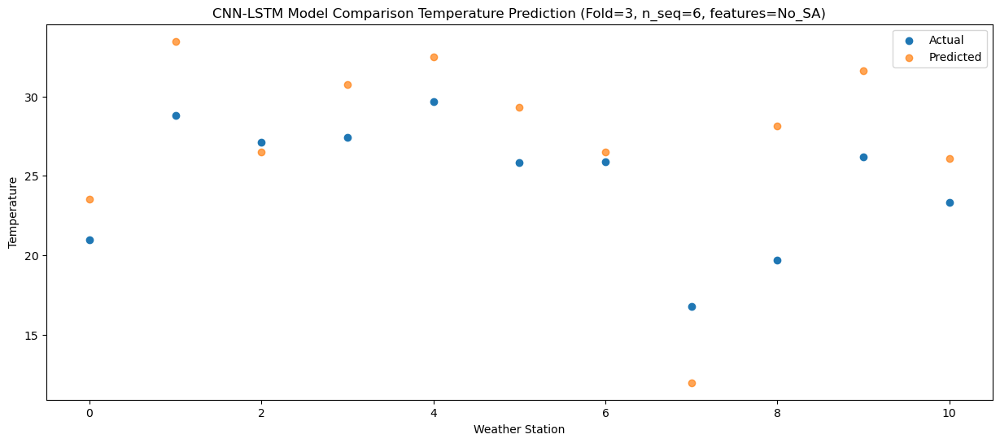

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]]
[[ 2.87432448  8.79741073  6.81261442  6.96932265  6.12011103  3.65549439
   4.99462582 -8.47731567  9.50741028  7.70942072  1.93775947]
 [ 2.20476775  4.79686713  7.09253028  4.79378291  1.70151714 -0.04530865
   4.18366803 -8.62693954 10.14502083  6.9011992   0.74492497]
 [10.05456643 17.92841125 10.97374776 15.05361434 15.44520286 12.61251491
  10.70986833 -3.84592701 13.45528804 13.99003539  8.76378007]
 [14.29654698 22.11278844 16.40717796 19.82704278 20.18101219 17.41010374
  15.89947213  1.57757496 18.626742   20.01513419 14.5565371 ]
 [18.52981285 27.11006093 20.64

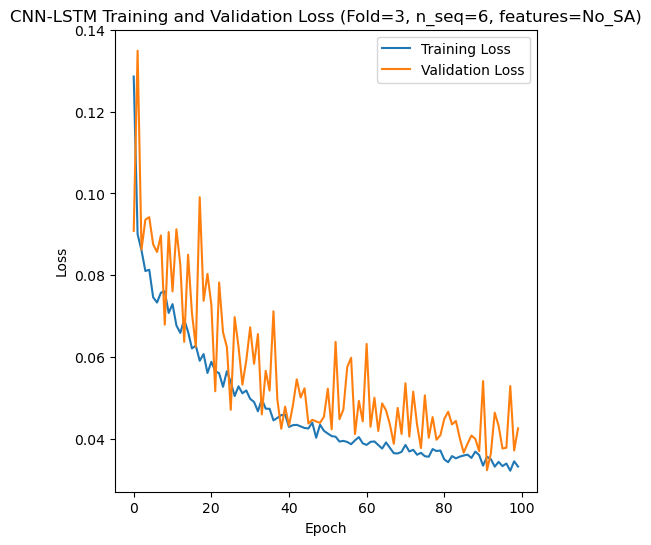

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 37s 239ms/step - loss: 0.1187 - accuracy: 0.5119 - mae: 0.1004 - rmse: 0.1187 - mape: 17.0540 - pearson: 0.6270 - val_loss: 0.1141 - val_accuracy: 0.7000 - val_mae: 0.0944 - val_rmse: 0.1141 - val_mape: 16.6833 - val_pearson: 0.5660
Epoch 2/100
84/84 [==============================] - 13s 153ms/step - loss: 0.0920 - accuracy: 0.5476 - mae: 0.0741 - rmse: 0.0920 - mape: 13.1062 - pearson: 0.6897 - val_loss: 0.1074 - val_accuracy: 0.2000 - val_mae: 0.0801 - val_rmse: 0.1074 - val_mape: 14.4000 - val_pearson: 0.6309
Epoch 3/100
84/84 [==============================] - 13s 160ms/step - loss: 0.0817 - accuracy: 0.6786 - mae: 0.0657 - rmse: 0.0817 - mape: 11.5415 - pearson: 0.7284

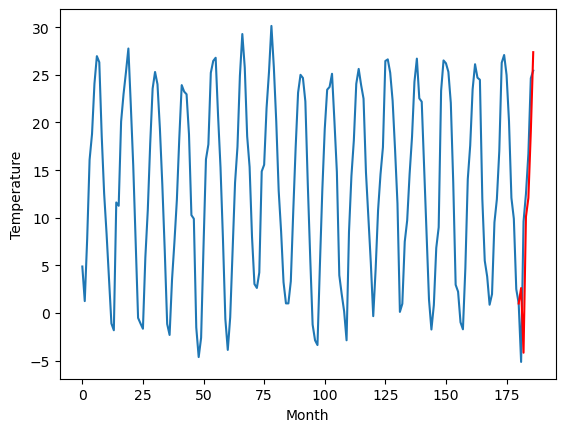

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		5.19		-0.40
9.02		6.41		-2.61
10.62		7.89		-2.73
12.06		9.10		-2.96
16.10		13.24		-2.86
17.73		15.91		-1.82
[180, 181, 182, 183, 184, 185, 186]
[14.25, 5.192861362695694, 6.407795354127884, 7.889969154596328, 9.096697255373002, 13.236528798341752, 15.914887591600419]


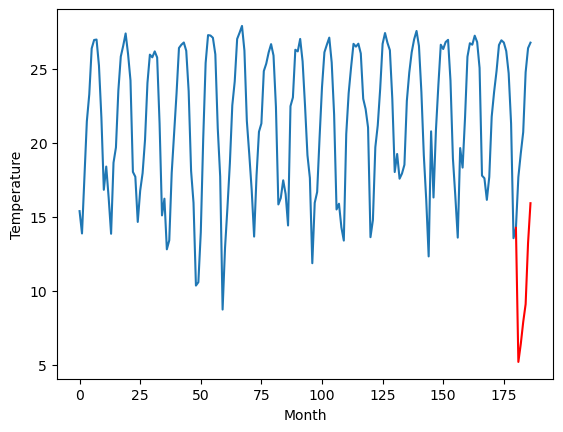

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		15.18		-0.23
13.49		12.63		-0.86
22.82		20.99		-1.83
23.89		21.89		-2.00
28.36		27.25		-1.11
32.62		32.18		-0.44
[180, 181, 182, 183, 184, 185, 186]
[9.06, 15.184225057363511, 12.631344054937363, 20.98936483740807, 21.888644074201586, 27.249335144758227, 32.17761978983879]


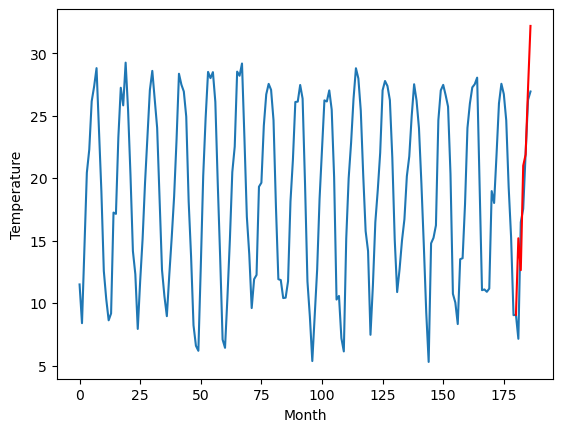

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		11.10		0.53
7.11		6.31		-0.80
18.07		17.75		-0.32
19.76		19.03		-0.73
23.92		25.14		1.22
29.60		31.74		2.14
[180, 181, 182, 183, 184, 185, 186]
[7.48, 11.09935851931572, 6.309562166929245, 17.751035174131395, 19.025696119070055, 25.140258630514147, 31.735650857687]


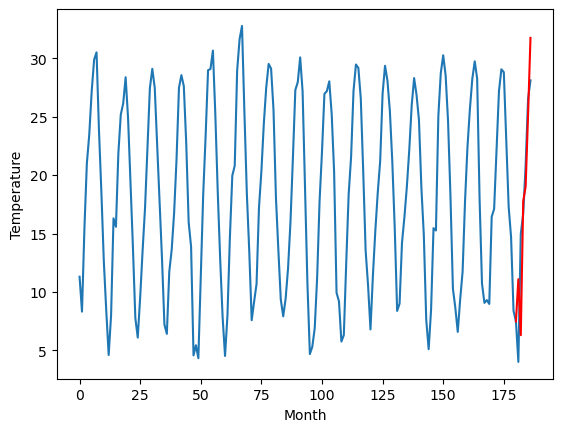

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.93		0.22
6.82		6.08		-0.74
17.74		17.51		-0.23
19.92		18.83		-1.09
23.45		24.97		1.52
30.30		31.64		1.34
[180, 181, 182, 183, 184, 185, 186]
[7.33, 10.929257718324662, 6.075122205018998, 17.5083440220356, 18.834172812700274, 24.97086295247078, 31.641967860460284]


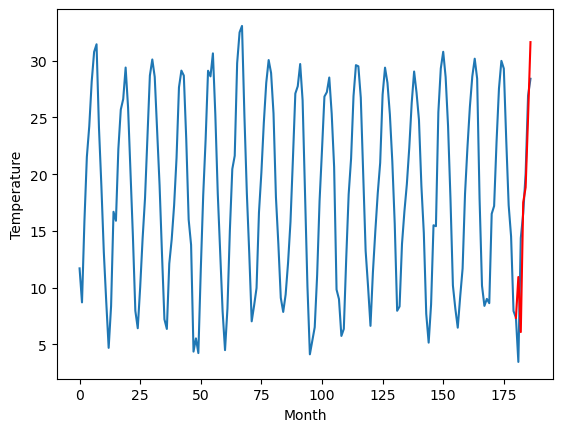

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		11.43		0.84
9.02		8.57		-0.45
18.27		16.04		-2.23
20.50		18.04		-2.46
25.99		23.65		-2.34
30.95		29.56		-1.39
[180, 181, 182, 183, 184, 185, 186]
[6.59, 11.434935661554336, 8.56792244553566, 16.0441764318943, 18.044841858148573, 23.6524425470829, 29.55720624566078]


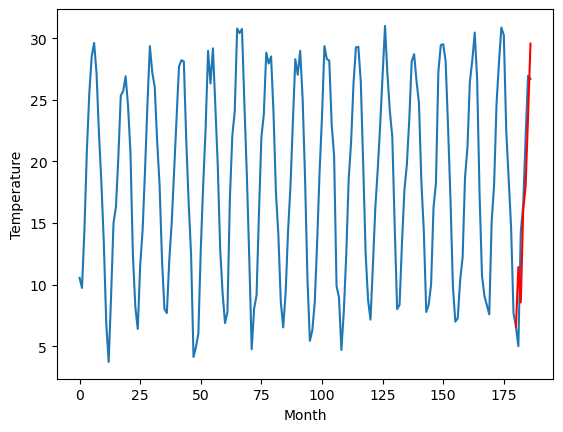

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.94		-0.85
11.46		8.94		-2.52
17.86		14.84		-3.02
20.59		16.40		-4.19
24.04		21.44		-2.60
28.06		25.94		-2.12
[180, 181, 182, 183, 184, 185, 186]
[6.04, 9.9402969455719, 8.94181471824646, 14.843236742019654, 16.398813900947573, 21.440020260810854, 25.942159352302554]


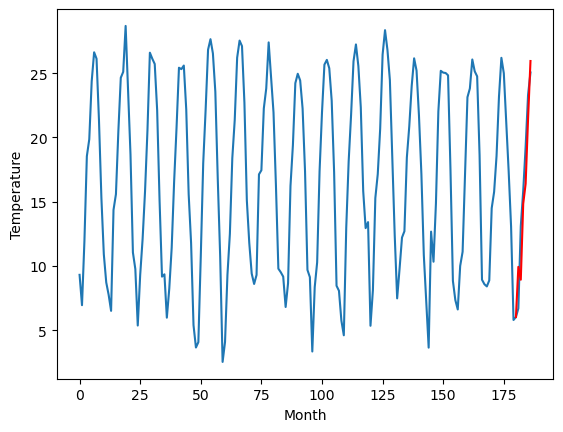

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.62		0.97
4.04		3.48		-0.56
16.31		15.62		-0.69
18.21		17.10		-1.11
22.25		23.40		1.15
28.55		30.41		1.86
[180, 181, 182, 183, 184, 185, 186]
[3.13, 8.623294897079468, 3.478575773239136, 15.617322988510132, 17.096394605636597, 23.402329034805298, 30.408186502456665]


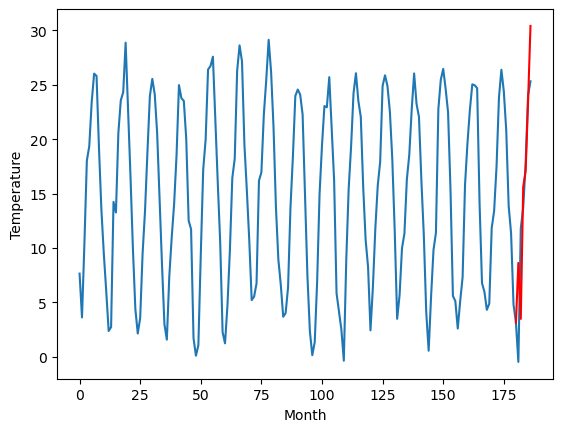

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.18		0.12
2.70		1.24		-1.46
14.67		12.98		-1.69
18.32		15.41		-2.91
22.73		21.90		-0.83
29.97		29.54		-0.43
[180, 181, 182, 183, 184, 185, 186]
[-0.29, 6.178132190704345, 1.2410622978210446, 12.976709499359131, 15.408056631088257, 21.903104677200318, 29.541539087295533]


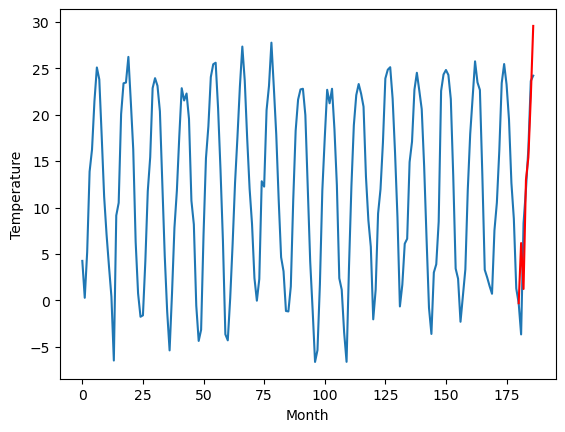

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.98		0.75
-2.21		-3.34		-1.13
11.65		10.45		-1.20
15.36		12.62		-2.74
20.14		19.47		-0.67
27.53		27.71		0.18
[180, 181, 182, 183, 184, 185, 186]
[-1.03, 2.9786110019683836, -3.3407645130157473, 10.451631078720093, 12.618773946762085, 19.46855355262756, 27.712306032180784]


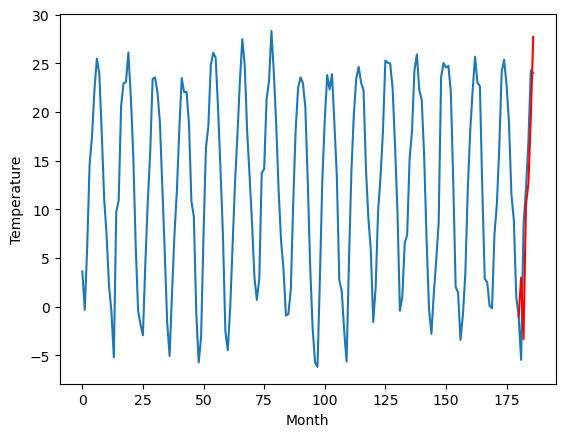

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		1.73		0.03
-0.54		-2.11		-1.57
9.35		7.50		-1.85
13.15		10.75		-2.40
17.68		17.09		-0.59
24.57		24.66		0.09
[180, 181, 182, 183, 184, 185, 186]
[-2.29, 1.7283047389984132, -2.1054140377044677, 7.503629083633423, 10.75282871246338, 17.086078758239747, 24.66400157928467]


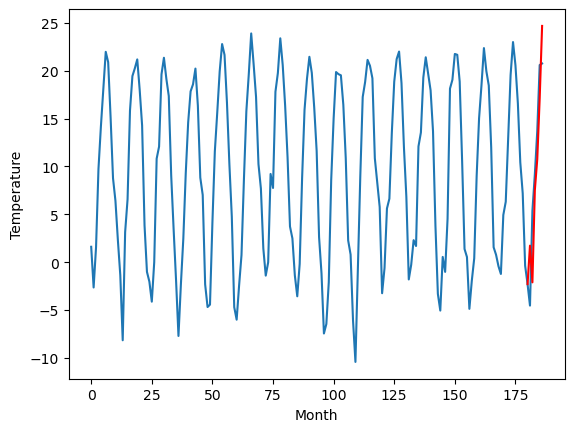

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.628912
1                 1    5.59   5.192861
2                 2   15.41  15.184225
3                 3   10.57  11.099359
4                 4   10.71  10.929258
5                 5   10.59  11.434936
6                 6   10.79   9.940297
7                 7    7.65   8.623295
8                 8    6.06   6.178132
9                 9    2.23   2.978611
10               10    1.70   1.728305


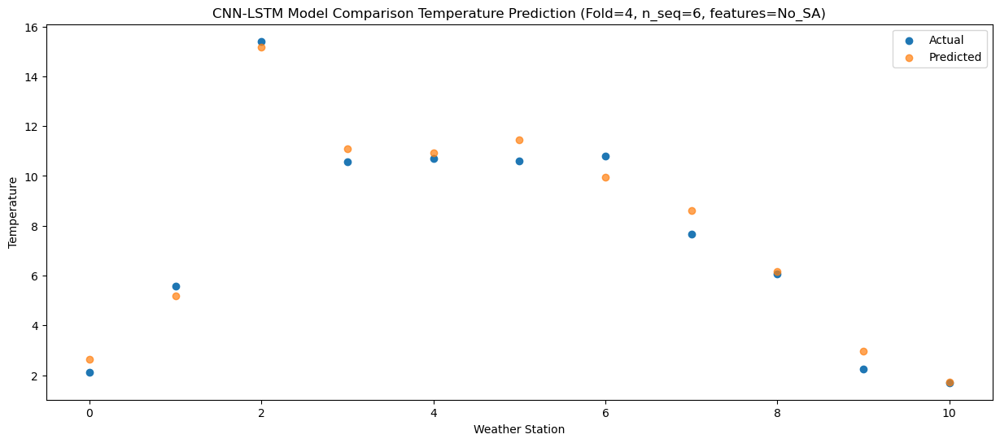

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -4.154243
1                 1    9.02   6.407795
2                 2   13.49  12.631344
3                 3    7.11   6.309562
4                 4    6.82   6.075122
5                 5    9.02   8.567922
6                 6   11.46   8.941815
7                 7    4.04   3.478576
8                 8    2.70   1.241062
9                 9   -2.21  -3.340765
10               10   -0.54  -2.105414


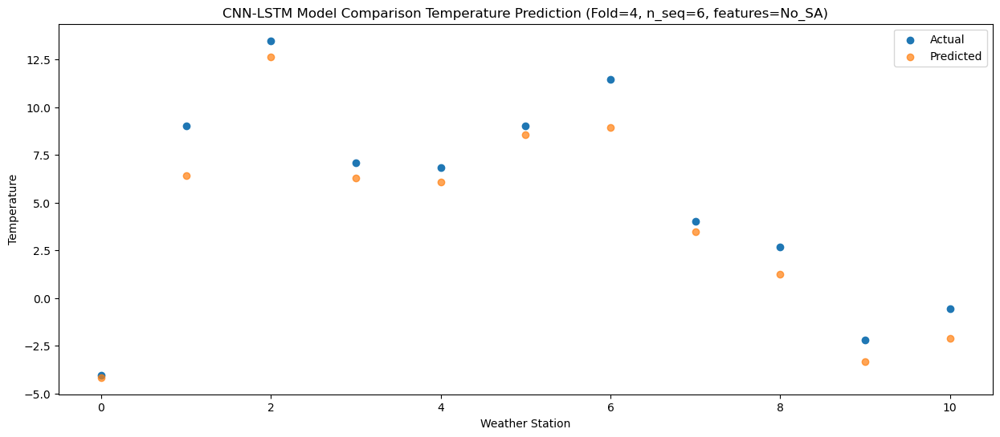

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71  10.115348
1                 1   10.62   7.889969
2                 2   22.82  20.989365
3                 3   18.07  17.751035
4                 4   17.74  17.508344
5                 5   18.27  16.044176
6                 6   17.86  14.843237
7                 7   16.31  15.617323
8                 8   14.67  12.976709
9                 9   11.65  10.451631
10               10    9.35   7.503629


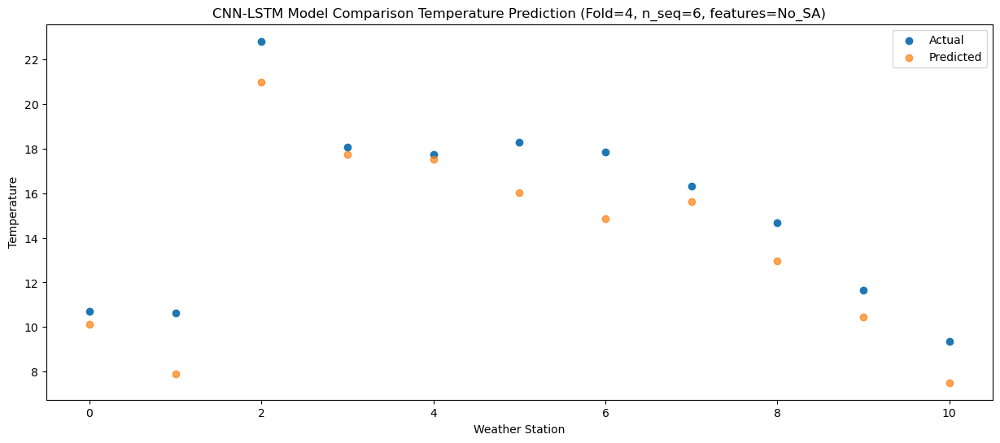

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  12.089108
1                 1   12.06   9.096697
2                 2   23.89  21.888644
3                 3   19.76  19.025696
4                 4   19.92  18.834173
5                 5   20.50  18.044842
6                 6   20.59  16.398814
7                 7   18.21  17.096395
8                 8   18.32  15.408057
9                 9   15.36  12.618774
10               10   13.15  10.752829


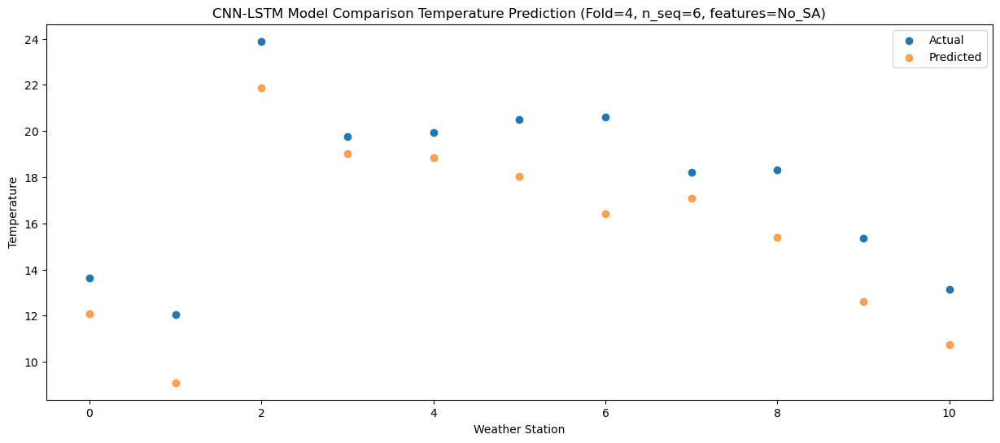

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  19.015644
1                 1   16.10  13.236529
2                 2   28.36  27.249335
3                 3   23.92  25.140259
4                 4   23.45  24.970863
5                 5   25.99  23.652443
6                 6   24.04  21.440020
7                 7   22.25  23.402329
8                 8   22.73  21.903105
9                 9   20.14  19.468554
10               10   17.68  17.086079


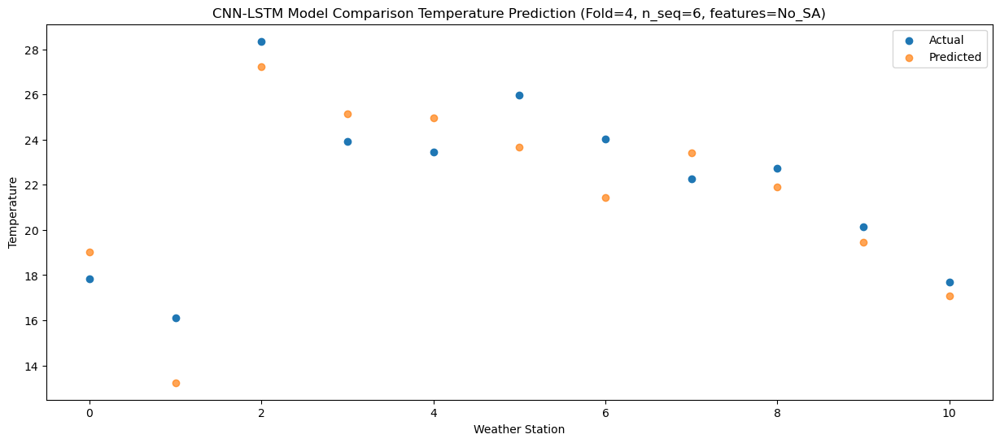

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  27.375902
1                 1   17.73  15.914888
2                 2   32.62  32.177620
3                 3   29.60  31.735651
4                 4   30.30  31.641968
5                 5   30.95  29.557206
6                 6   28.06  25.942159
7                 7   28.55  30.408187
8                 8   29.97  29.541539
9                 9   27.53  27.712306
10               10   24.57  24.664002


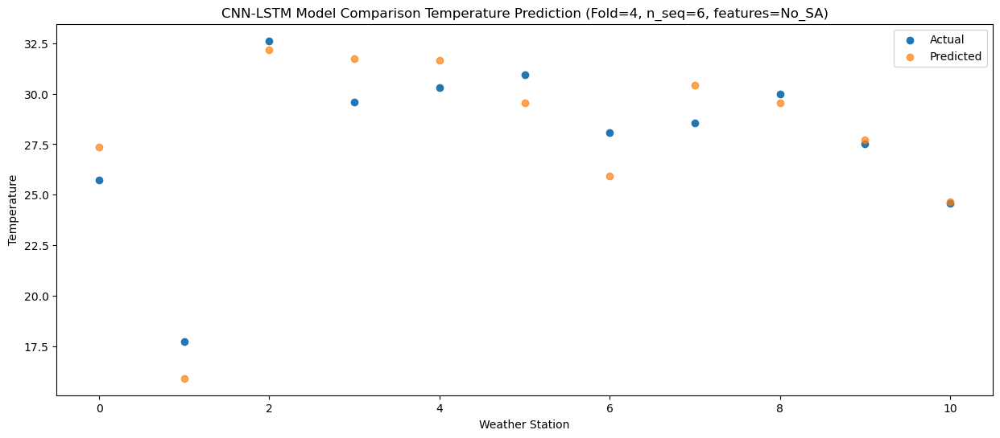

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]]
[[ 2.62891227  5.19286136 15.18422506 11.09935852 10.92925772 11.43493566
   9.94029695  8.6232949   6.17813219  2.978611    1.72830474]
 [-4.15424318  6.40779535 12.63134405  6.30956217  6.07512221  8.56792245
   8.94181472  3.47857577  1.2410623  -3.34076451 -2.10541404]
 [10.11534816  7.88996915 20.98936484 17.75103517 17.50834402 16.04417643
  14.84323674 15.61732299 12.9767095  10.45163108  7.50362908]
 [12.08910816  9.09669726 21.88864407 19.02569612 18.83417281 18.04484186
  16.3988139  17.09639461 15.40805663 12.61877395 10.75282871]
 [19.01564425 13.2365288  27.24

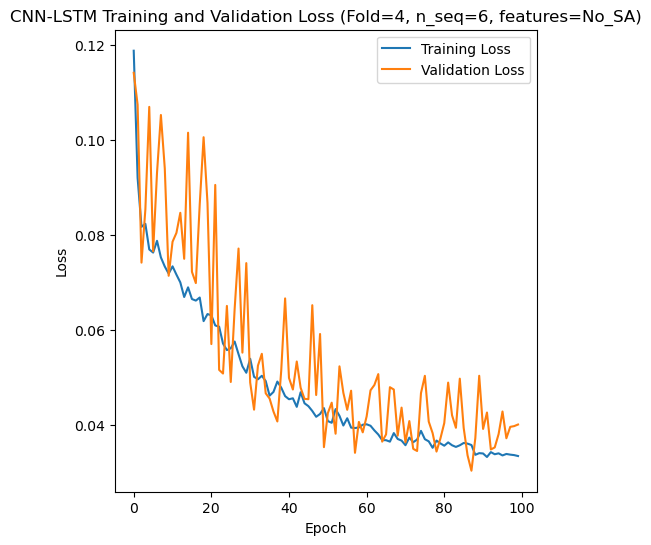

[[0.908819494655417], [2.187141882157739], [2.7974925596742874], [2.7192225292466703], [1.6262662605316744]]
[[array(0.90881949)], [array(2.18714188)], [array(2.79749256)], [array(2.71922253)], [array(1.62626626)]]
[[0.7394276061970179], [1.8393654511558515], [1.939180688189737], [2.1504458385615632], [1.338234626235384]]
[[0.07942121511106785], [0.10355432721355089], [0.1539427637783291], [0.20428310485151124], [0.14995487278940328]]
[[0.9864498506724991], [0.9147263040135734], [0.8852539972487198], [0.8992352357473989], [0.9663255736331138]]
[[array(0.05981489)], [array(0.10355433)], [array(0.15394276)], [array(0.17180366)], [array(0.04559224)]]
[[array(0.98738622)], [array(0.98893282)], [array(0.91292469)], [array(0.95804206)], [array(0.9766285)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 12.87 12.78 17.84 19.24 23.26 26.74
 15.34 16.2  22.18 23.82 27.8  31.94  9.    7.43 15.34 17.13 21.1  24.38
 13.35 10.26 20.16 22.09 25.95 31.15 11.52 12.17 17.07 20.44 23.95 28.52
 10.21 10.85 17.83 1

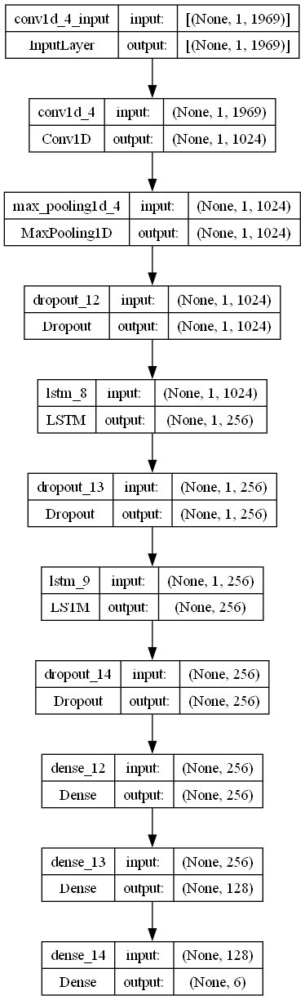

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 1024
    lr = 0.06077065962790183
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 256
    dropout_rate = 0.28693073271555414

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S6_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)